In [ ]:
#from Tools import *
import numpy as np
import seaborn as sns
import pandas as pd
from BayesianInference import *
from random import Random
import random
from scipy.interpolate import interp1d
from scipy.stats import rv_continuous
from astropy.io import ascii
import emcee
import pathos.multiprocessing as multiproc
from multiprocessing import Pool
import corner
from IPython.display import display, Math
from palettable.cartocolors.qualitative import Antique_3
from matplotlib.colors import ListedColormap
import seaborn as sns
import glob 
import warnings
from scipy.integrate import quad
import Tools


## MCMC Functions

In [ ]:
def Likelihood(FWHM, dFWHM, mu, sigma):
    """
    Lognormal Likelihood: Probability of having a certain value of FWHM given the lognormal parameters A and Wo

    Args:
        FWHM: Full Width at Half Maximum observed
        dFWHM: Posteiror distribution of FWHM
        A: Parameter lognormal (should depend on our other observables, such as uvslope and muv)
        Wo: Parameter lognormal (should depend on our other observables, such as uvslope and muv)
    """

    p = (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(- (FWHM - mu)**2 / (2 * sigma**2))  # Normal distribution
    
    return p




def Posterior(FWHM, dFWHM,mu, sigma):
    """
    """
    probLike=[]  
    probLike.append(Likelihood(FWHM, dFWHM,mu, sigma))
    return np.array(probLike)


def log_prior(theta):
    # I can put priors here or in the equation in the BInf object 
    mu,sigma= theta
    if (mu >= 2.).all() and (mu < 2.8).all() and (sigma > 0.1).all() and (sigma < 1).all():
        return 0.0 
    return -np.inf

def log_likelihood(theta,FWHM, dFWHM):
    mu,sigma= theta
    model = Posterior(FWHM, dFWHM,mu,sigma) # Does thus have to be exp, so it gets outside the logaritm?
    return np.sum(np.log(model))


def log_probability(theta, FWHM, dFWHM):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    lL=log_likelihood(theta,FWHM, dFWHM)
    #print(lL)
    if np.isnan(lL)==True:
        return -np.inf
    else:
        return lp + lL

## ADD FWHM TO catalog

In [17]:
Run=True
Posterior_int=[]

#Catalog=ascii.read('../../A-Catalogs/Binospec-Candels.cat')

#Catalog['dLyaFWHM'][Catalog["id_charlotte"] == "z5_GNW_20906"]=253.3
#Catalog['dLyaFWHM_int'][Catalog["id_charlotte"] == "z5_GNW_20906"]=253.35
#print(Catalog['dLyaFWHM'][Catalog["id_charlotte"] == "z5_GNW_20906"])
#print(Catalog['dLyaFWHM_int'][Catalog["id_charlotte"] == "z5_GNW_20906"])
#ascii.write(Catalog, "../../A-Catalogs/Binospec-Candels.cat", overwrite=True)



if Run==True:

    Catalog=ascii.read('../../A-Catalogs/Binospec-Candels.cat')
    AllData=np.load("/Users/gonzalo/Desktop/Code/Gonzalo_Binospec/A-Project/B-CalibrationCode/Posterior_FWHM.npy",allow_pickle=True)
    AllData=AllData.item()
    IDs=AllData.keys()



    #Observed
    for id in IDs:
        
        if Catalog['Type'][Catalog["id_charlotte"] == id]!="LAE":
            continue
        #Observed
        FWHM=np.nanmedian(AllData[id])
        dFWHM=np.nanstd(AllData[id])
        Catalog['LyaFWHM'][Catalog["id_charlotte"] == id] = FWHM
        Catalog["dLyaFWHM"][Catalog["id_charlotte"] == id] = dFWHM

        #intrinsic
        redshift=Catalog["z"][Catalog["id_charlotte"] == id].value[0]
        wave=1215.67*(1+redshift)
        inst=70 #resolution
        int_FWHM_sample=(np.sqrt(AllData[id]**2-inst**2))
        Posterior_int.append(int_FWHM_sample)

        int_FWHM=np.nanmedian(int_FWHM_sample)
        d_int_FWHM=np.nanstd(int_FWHM_sample)


        Catalog['LyaFWHM_int'][Catalog["id_charlotte"] == id] = int_FWHM
        Catalog["dLyaFWHM_int"][Catalog["id_charlotte"] == id] = d_int_FWHM


    #ascii.write(Catalog, "../../A-Catalogs/Binospec-Candels.cat", overwrite=True)

<ipython-input-17-2da0a6d32f3e>:38: RuntimeWarning: invalid value encountered in sqrt
  int_FWHM_sample=(np.sqrt(AllData[id]**2-inst**2))
/Users/gonzalo/opt/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1119: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/gonzalo/opt/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


## load Data

In [23]:
Catalog=ascii.read('../../A-Catalogs/Binospec-Candels.cat')
Catalog=Catalog[np.isnan(Catalog['LyaFWHM_int'])==False]
#Catalog=Catalog[Catalog["LyaFWHM_int"]<700]
#AllData=np.load("/Users/gonzalo/Desktop/Code/Gonzalo_Binospec/A-Project/B-CalibrationCode/Posterior_FWHM.npy",allow_pickle=True)
#AllData=AllData.item()


#FWHM_posterior_A=[]
#FWHM_ID=[]
#for gal in Catalog:
#    id=gal["id_charlotte"]
#    if id=="Hu10_z7_1":
#        FWHM_posterior_A.append(np.random.normal(300,30,1000))
#        FWHM_ID.append(id)
#    else:
#        FWHM_posterior_A.append(AllData[id])
#        FWHM_ID.append(id)
         
#FWHM_posterior_kms=FWHM_posterior_A


#FWHM_posterior_int=[]

#for i in range(0,len(FWHM_posterior_kms)):
#    wave=1215.67*(1+Catalog[i]["z"])
#    inst=Tools.Give_instrumental_Res(wave)
#    FWHM_posterior_int.append(np.sqrt(FWHM_posterior_kms[i]**2-inst**2))


#for i in range(0,len(Catalog)):

#    med_cat=Catalog[i]["LyaFWHM_int"]
#    med_run=np.nanmedian(FWHM_posterior_int[i])


In [24]:
FWHM= Catalog['LyaFWHM_int'][np.isnan(Catalog['LyaFWHM_int'])==False]
dFWHM= Catalog['dLyaFWHM_int'][np.isnan(Catalog['LyaFWHM_int'])==False]

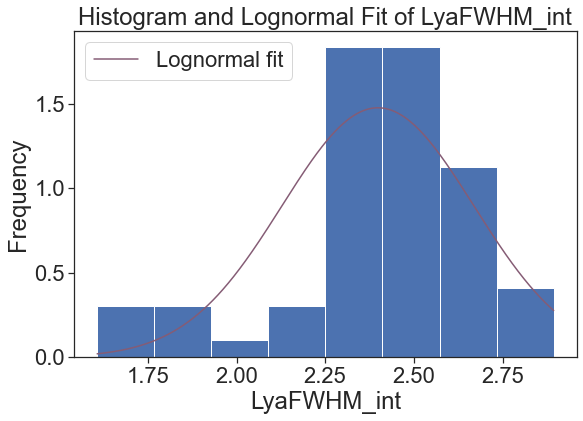

Shape parameter: 2.3983
Scale parameter: 0.2705


In [25]:
from scipy.stats import norm

FWHM= Catalog['LyaFWHM_int'][np.isnan(Catalog['LyaFWHM_int'])==False]
plt.hist(np.log10(Catalog['LyaFWHM_int']),bins=8,density=True)
# Fit a lognormal distribution to the data
data = np.log10(Catalog['LyaFWHM_int'][np.isnan(Catalog['LyaFWHM_int'])==False])

# Fit a normal distribution to the data
shape, scale = norm.fit(data)

# Generate the x values for the fitted curve
x = np.linspace(min(data), max(data), 1000)

# Generate the PDF of the fitted normal distribution
pdf = norm.pdf(x, shape, scale)


plt.plot(x, pdf, label='Lognormal fit', color=Antique_3.mpl_colors[0])
plt.legend()
plt.xlabel('LyaFWHM_int')
plt.ylabel('Frequency')
plt.title('Histogram and Lognormal Fit of LyaFWHM_int')
plt.show()

print(f"Shape parameter: {shape:.4f}")
print(f"Scale parameter: {scale:.4f}")
#print(f"loc parameter: {loc:.4f}")

In [26]:
%load_ext autoreload
%autoreload



BInf=BayesInf()
BInf.FWHM=FWHM
BInf.dFWHM=dFWHM
FWHM_posterior_int_log10 = [np.log10(arr) for arr in Posterior_int]
FWHM_posterior_int_log10 = [arr[~np.isnan(arr)] for arr in FWHM_posterior_int_log10]
FWHM_posterior_int_log10 = [arr for arr in FWHM_posterior_int_log10 if arr.size > 0]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [27]:
print(FWHM_posterior_int_log10 )

[array([2.68269216, 2.46595265, 2.21524121, ..., 2.43919594, 2.23585319,
       2.19013323]), array([2.42262994, 2.44964393, 2.6084661 , ..., 2.36463941, 2.5216311 ,
       2.51091366]), array([1.89960688, 2.06732779, 2.07414662, ..., 1.91106363, 2.18012124,
       2.43303612]), array([2.3104225 , 2.30456008, 2.21942882, ..., 2.2488073 , 2.18149339,
       2.09252128]), array([2.4568079 , 2.45089591, 2.20359873, ..., 2.28327214, 2.41942552,
       2.49686155]), array([2.41461632, 2.51472652, 2.48378754, ..., 2.47666784, 2.45737731,
       2.47996104]), array([2.5279261 , 2.57786952, 2.6114281 , ..., 2.54344218, 2.50912217,
       2.59088121]), array([2.51039501, 2.44069408, 2.603954  , ..., 2.55202234, 2.53948632,
       2.61397181]), array([2.49434784, 2.27637129, 2.83926047, ..., 2.58901856, 2.44746498,
       2.46520512]), array([2.27921417, 2.69114601, 2.34564074, ..., 2.6119659 , 2.37377241,
       2.0939059 ]), array([2.50335697, 2.47419508, 2.49952179, ..., 2.43722319, 2.5011909

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[2.68269216 2.46595265 2.21524121 ... 2.43919594 2.23585319 2.19013323]
[2.42262994 2.44964393 2.6084661  ... 2.36463941 2.5216311  2.51091366]
[1.89960688 2.06732779 2.07414662 ... 1.91106363 2.18012124 2.43303612]
[2.3104225  2.30456008 2.21942882 ... 2.2488073  2.18149339 2.09252128]
[2.4568079  2.45089591 2.20359873 ... 2.28327214 2.41942552 2.49686155]
[2.41461632 2.51472652 2.48378754 ... 2.47666784 2.45737731 2.47996104]
[2.5279261  2.57786952 2.6114281  ... 2.54344218 2.50912217 2.59088121]
[2.51039501 2.44069408 2.603954   ... 2.55202234 2.53948632 2.61397181]
[2.49434784 2.27637129 2.83926047 ... 2.58901856 2.44746498 2.46520512]
[2.27921417 2.69114601 2.34564074 ... 2.6119659  2.37377241 2.0939059 ]
[2.50335697 2.47419508 2.49952179 ... 2.43722319 2.50119099 2.51507114]
[1.59970726 1.66919405 1.74242285 ... 1.55617007 1.93186088 1.71862576]
[2.51831717 2.50995411 2.48498448 ... 2.52699704

  0%|          | 0/10500 [00:00<?, ?it/s]


[2.6925056  2.67762707 2.71537269 ... 2.78768677 2.72792981 2.8405917 ]
[2.56046215 2.48760657 2.55165563 ... 2.60973115 2.59690219 2.5488607 ]
[2.68741675 2.71561937 2.64760228 ... 2.66765419 2.71086295 2.59814073]
[2.64413807 2.67441816 2.63725342 ... 2.5990887  2.59183008 2.62065131]
[2.36343107 2.26905185 2.32570465 ... 2.3257201  2.26907671 2.24976622]
[2.25883175 2.23668417 2.27193322 ... 2.23886116 2.28266897 2.28458183]
[2.81438324 2.62211871 2.5462616  ... 2.54492826 2.49806927 2.79954446]
[2.574823   2.64932463 2.63975315 ... 2.6509978  2.50658644 2.6677668 ]
[2.5678732  2.54796857 2.55200032 ... 2.56080822 2.55126344 2.55165333]
[1.75295284 1.63077406 1.86788554 ... 1.66404799 1.87662819 1.85581783]
[2.75478129 2.85006756 2.81751953 ... 2.75584456 2.75101794 2.86960525]
[2.63052589 2.68830778 2.73764378 ... 2.67921697 2.7178511  2.77212088]
[2.38200499 2.32178079 2.39720274 ... 2.39432812 2.36396129 2.36008455]
[2.89333912 2.89298839 2.89332769 ... 2.89437733 2.89318788 2.8

100%|██████████| 10500/10500 [00:18<00:00, 569.01it/s]


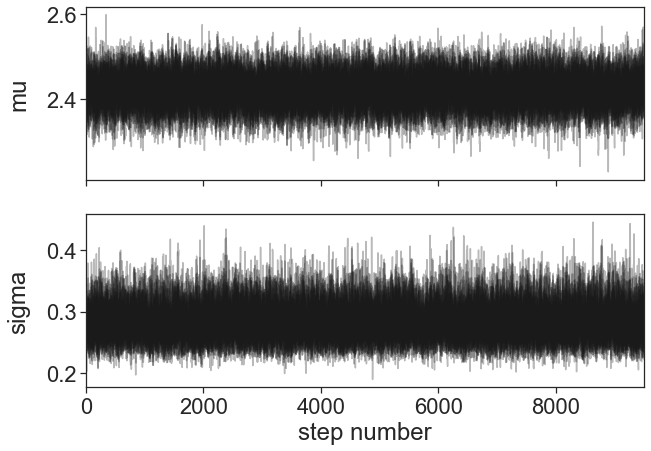

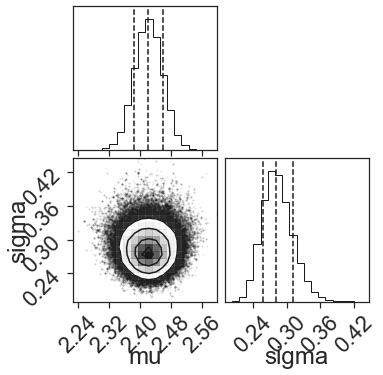

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 54/10500 [00:00<00:19, 539.93it/s]

[1.9905950091967948, 2.3761926627733096, 1.9064666613747097, 2.2792373669406234, 2.4692547043171005, 2.4533130858253136, 2.5616212220707677, 2.503541923941352, 2.5681579103824754, 2.71951171138033, 2.4689677398560126, 1.8539321792533825, 2.483325054642204, 2.1216184190763294, 2.2725654168753344, 2.41929012752382, 2.182032565428968, 2.303038376539249, 2.3376744877026394, 1.9287952287953298, 2.297807088214533, 2.2960631637737143, 1.9446556280705052, 2.702553585439753, 2.5747824154816685, 2.491252580572935, 2.468340661234659, 2.6633683569260094, 2.468966740620634, 2.5646561033807154, 2.793026195781134, 2.6245338212203864, 2.6517483942120155, 2.580449983953275, 2.367651286901856, 2.2679379687795107, 2.6331258622737295, 2.511458216808592, 2.5520003161271787, 1.5752661326349868, 2.7214601388457114, 2.73427762490024, 2.3922008634757965, 2.8943695228980695, 1.5382565999477067, 2.3921799787430134, 2.4700503859921406, 2.52289697117026, 2.4652136759104653, 2.7033243390536668, 2.151582229378905, 2

100%|██████████| 10500/10500 [00:21<00:00, 482.00it/s]


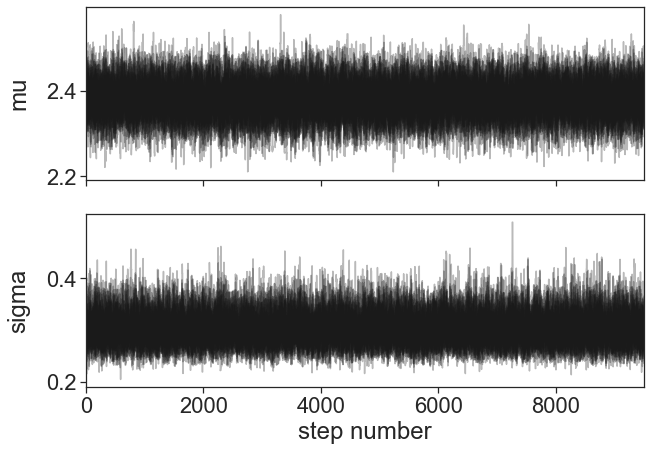

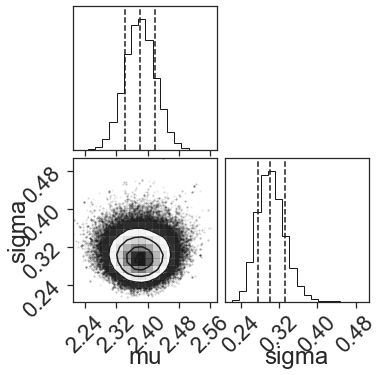

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 47/10500 [00:00<00:22, 466.38it/s]

[2.1714980185134456, 2.4665514351592916, 2.102483243291675, 2.1945719668422274, 2.4039946045107525, 2.505031006952724, 2.5349128413453794, 2.505950746174128, 2.652960146268288, 2.2859575277140225, 2.5049893596832766, 2.095796106726537, 2.4932982556676966, 2.2729099757847506, 2.3396944076537305, 2.533118149928886, 2.2592405200356307, 2.332525899192869, 2.0557915353952745, 1.1036592290321505, 2.3020554449318498, 2.3461873257164783, 1.9075808060001942, 2.659119315455521, 2.6420150289324105, 2.6366268200513923, 2.4037975774517597, 2.6549307452938686, 2.477894593229211, 2.6009880236197658, 2.7689216669292556, 2.5943571990557923, 2.6695230376313095, 2.657348982407243, 2.351975588447013, 2.281712123450395, 2.7089102340719395, 2.719468593095113, 2.5516322863018, 1.8794761444190908, 2.6480995490718695, 2.693248383371367, 2.3805235111235654, 2.8931382417031357, 1.5937475302683624, 2.3970154730779365, 2.5482447581061862, 2.57380949305376, 2.5208883965190476, 2.4996732679677987, 2.1637035276359193

100%|██████████| 10500/10500 [00:25<00:00, 416.43it/s]


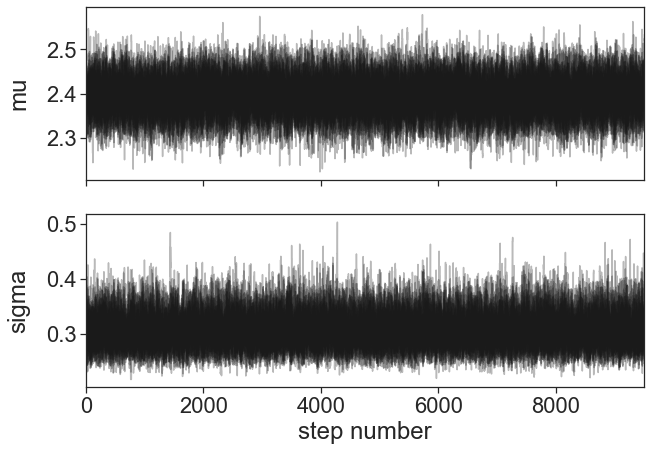

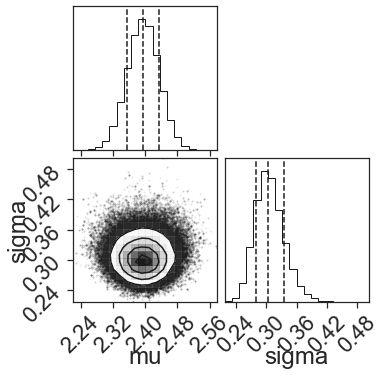

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 42/10500 [00:00<00:25, 404.53it/s]

[1.8178420256886112, 2.4596728517962934, 2.115882649066036, 2.2004460764683804, 2.3172383538845978, 2.475565067272916, 2.477420545742724, 2.4581635770964625, 2.545045049865753, 2.2113229049865235, 2.519774664139787, 1.9940875905197373, 2.5250005524602357, 2.1522188602555863, 2.261122991776215, 2.49661009810399, 2.316483068088107, 2.354806923693638, 2.181604611761734, 2.0101620208717947, 2.3227380438170493, 2.329908736620585, 1.9421940848675623, 2.679509430253789, 2.6132710784565023, 2.500790895553039, 2.35194906793615, 2.6151340235265206, 2.4615737577675074, 2.5773685032008955, 2.8595992657286913, 2.6276843333129283, 2.6825326904563336, 2.6536205843955107, 2.326499101736916, 2.3078509956789817, 2.6610765742552047, 2.6259029679621992, 2.5516322863018, 1.637776166346413, 2.7467072997108444, 2.7061281464247204, 2.3805413397899007, 2.8935476054985867, 1.3960789635154431, 2.4337513352458497, 2.365942451967787, 2.558986477392419, 2.561285725486239, 2.620475435427654, 2.1789305371395806, 2.41

100%|██████████| 10500/10500 [00:25<00:00, 406.32it/s]


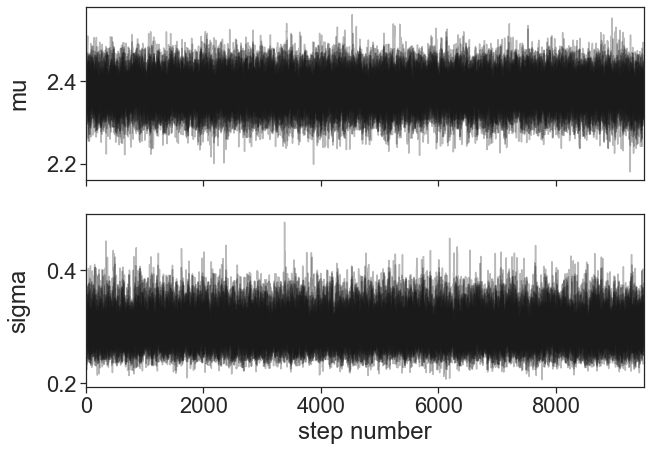

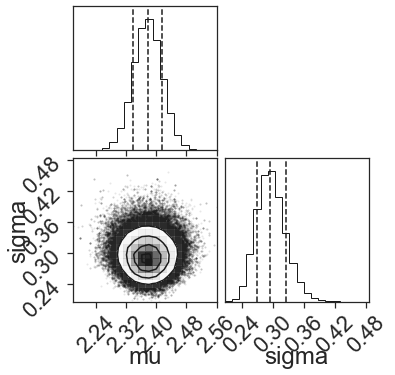

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 27/10500 [00:00<00:39, 263.03it/s]

[2.528836397213407, 2.5548035981250607, 2.1217764557044334, 2.204343051006612, 2.3362732874928693, 2.508073258111745, 2.52067415355332, 2.4481293397081507, 2.7340842147961015, 2.1776635410398133, 2.50010176826133, 1.5656684117310584, 2.500913862478306, 2.2801619968108984, 2.191240138746127, 2.5838314076460076, 2.072485128729712, 2.3765503996323516, 2.446834464452045, 1.6528057277668209, 2.3187022332428318, 2.4112017096400984, 2.149961128949082, 2.7078686974067496, 2.550166583583087, 2.5703473632722056, 2.4290249904476715, 2.676344276650446, 2.456373238968152, 2.6625003082472403, 2.783695185156097, 2.6400198809782527, 2.7174841952610516, 2.6058561132302147, 2.3050109033195945, 2.274877134660929, 2.5842855166076615, 2.660307496189415, 2.5535881125688813, 1.7864234727773738, 2.7452401535235085, 2.7298988335262186, 2.3608563881371634, 2.893418083053405, 1.6616593021796664, 2.558897491935542, 2.511003219436562, 2.532240383901466, 2.427291423454812, 2.697571677802904, 2.249792395257396, 2.39

100%|██████████| 10500/10500 [00:22<00:00, 463.25it/s]


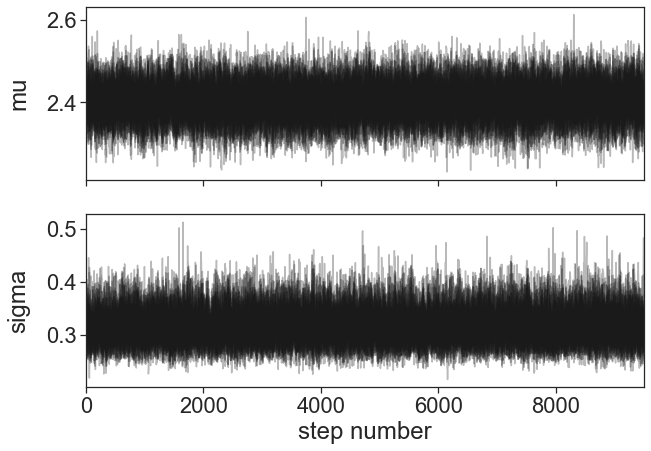

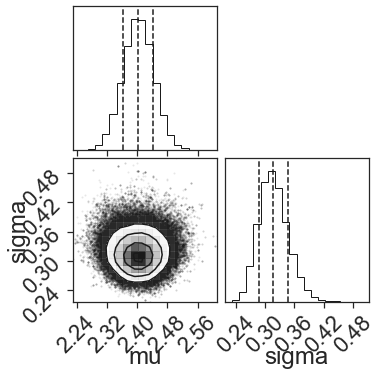

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 64/10500 [00:00<00:16, 633.86it/s]

[2.2960336733328197, 2.5867694163345467, 1.8830489070972702, 2.2410181151251822, 2.34776410646314, 2.4945404899411243, 2.4773970924081166, 2.571256228284728, 2.3787452568402827, 2.688917102352295, 2.47248077401385, 2.057656412583958, 2.5183057323455658, 2.159720600041551, 2.2473332163139528, 2.4971455005739225, 2.2026494059860546, 2.100387895667451, 2.4722247696766004, 1.8287246938278323, 2.342377942672115, 2.325154035595493, 1.9266978837601474, 2.7240564303188934, 2.57064435938988, 2.4950531471289503, 2.3933962062835286, 2.6113966284233276, 2.4604216593771437, 2.5288135510560306, 2.7752789933785813, 2.5823363905736483, 2.6273592462006046, 2.600837923361051, 2.3017342206956046, 2.2816998680365805, 2.3258521236827363, 2.5710851849629908, 2.5584412574001103, 1.6512829437559802, 2.8007911475586122, 2.787308119029432, 2.3514430023636823, 2.8933052795950407, 1.7238948988958638, 2.590483120669512, 2.623305478069794, 2.614410132169421, 2.5379034757372843, 2.53953989932098, 2.1325103095079543,

100%|██████████| 10500/10500 [00:19<00:00, 527.72it/s]


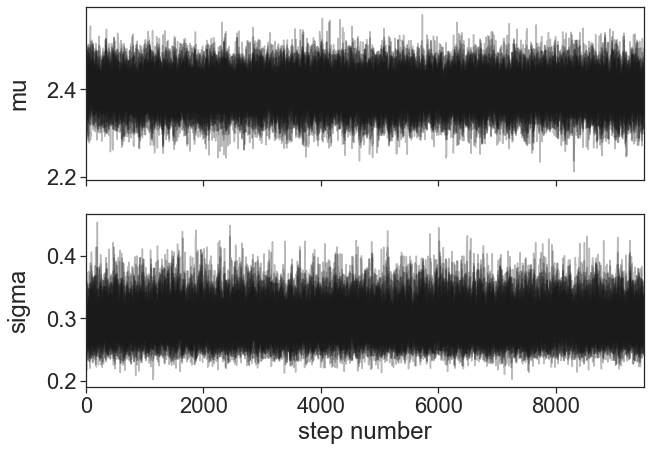

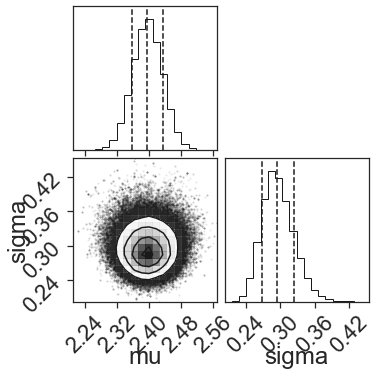

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 43/10500 [00:00<00:24, 424.92it/s]

[2.3799658386948295, 2.516007437561543, 1.904237659967821, 2.2878642558771154, 2.4747320670149904, 2.4982510097234427, 2.474572178764595, 2.603610024899187, 2.291097017948378, 2.6199609510503445, 2.5124166799026932, 1.7378029609458463, 2.5188436353898997, 2.2310459696811344, 2.2381875611523827, 2.530207998245352, 2.180905207710168, 2.162854960700916, 2.514179424127997, 1.7640762597764175, 2.4226496748620394, 2.2943299046866517, 2.1444611936020186, 2.6991090785146326, 2.649879484640882, 2.5225482204468013, 2.4303166855401486, 2.608034481820745, 2.4672738003881642, 2.626695185547524, 2.6918196766472238, 2.6268976938079587, 2.7322053091412806, 2.6149204668662036, 2.338689592529073, 2.294052055068184, 2.5865858742774797, 2.5917201880395067, 2.544220308049959, 1.846402975183387, 2.7615323799410394, 2.7706562089386226, 2.3368646684023564, 2.8933443139110073, 1.6722535106849756, 2.473764024287063, 2.6055489469053046, 2.430946480861357, 2.503131389565846, 2.685835161005883, 2.1684622046351767,

100%|██████████| 10500/10500 [00:19<00:00, 541.01it/s]


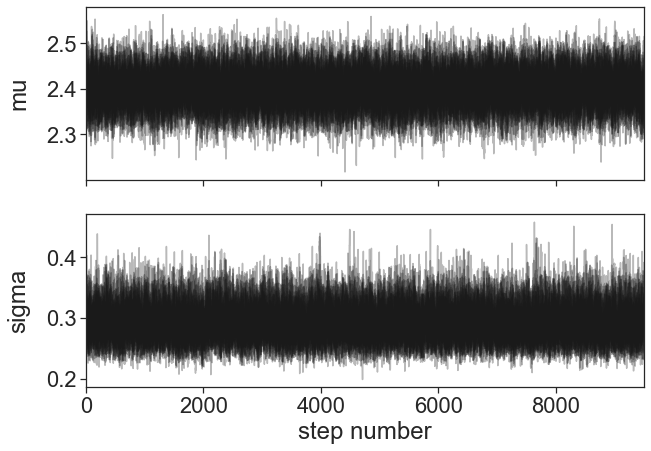

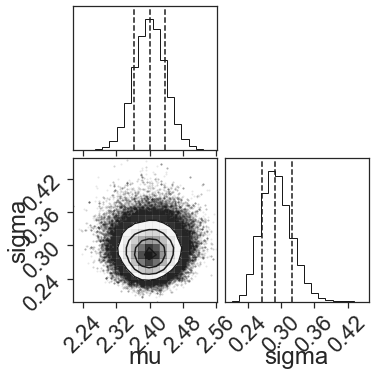

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 64/10500 [00:00<00:16, 634.16it/s]

[2.337485578221277, 2.3755223074296223, 2.199615199354937, 2.258954916984306, 2.479214247467114, 2.502443148856944, 2.544822283508793, 2.6144059111261937, 2.686732748081002, 2.423052762208425, 2.459490473360638, 1.8775539009416564, 2.4725038570396176, 2.2616221766028675, 2.2235473036771265, 2.538912357706983, 2.2290606043657974, 2.182852299910747, 2.3076252889090973, 1.910100213234088, 2.2637273041005597, 2.321095735446926, 2.039128730491134, 2.7760017393050855, 2.4700390502403726, 2.552508830769975, 2.397592315470758, 2.6724946745897107, 2.4717841597581716, 2.5592619255913616, 2.79147140704196, 2.5753407518847973, 2.651637559695579, 2.656618687822018, 2.354889148104087, 2.3158734300364614, 2.6720923174893203, 2.5533943483386494, 2.54383998877964, 1.651302356446379, 2.691034100640622, 2.6555293640657887, 2.369312265218446, 2.8933443139110073, 1.6206308881584264, 2.515187003637234, 2.4412423711315974, 2.559483286692193, 2.492330753463029, 2.6658996874474137, 2.1298982103390274, 2.401522

100%|██████████| 10500/10500 [00:19<00:00, 536.20it/s]


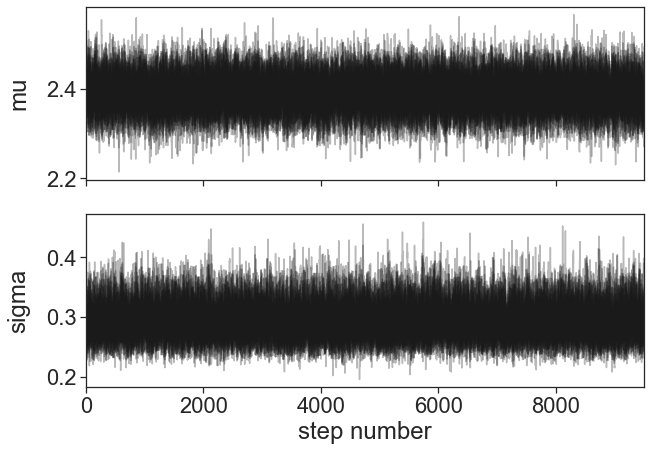

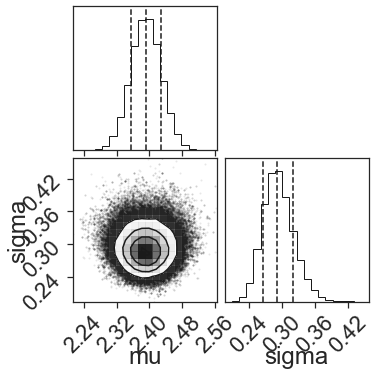

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 38/10500 [00:00<00:27, 375.73it/s]

[2.204528880689551, 2.5871317259990887, 2.0886057312614033, 2.1679036069699698, 2.4703911904918403, 2.4591439262043275, 2.553560601370855, 2.6135921726700073, 2.5805707278297465, 2.2867344004332746, 2.429529973855892, 2.0202338379405567, 2.506803294176701, 2.2578442815879907, 2.3109944085601684, 2.5811933812425534, 2.1919203052311484, 2.2775410105955585, 2.4661329583532483, 1.9697394531437908, 2.2908157798506945, 2.288248423268274, 1.3836203158919274, 2.718671121715926, 2.5924674332438276, 2.59150090568461, 2.3933975073657474, 2.641995268505845, 2.481739246436091, 2.599714227855524, 2.7013815695027876, 2.6154263325865896, 2.730385271065719, 2.635344582411273, 2.3017011813785477, 2.281703626276654, 2.403623115936103, 2.431285497910245, 2.563922000889997, 1.7743373575121495, 2.699259975304904, 2.6924594598857254, 2.3522220588374854, 2.8933391166336153, 1.600738612365455, 2.4641993997986233, 2.5032387353614425, 2.55995152346408, 2.5157395699864344, 2.6303899921665237, 2.1696444945501616, 

100%|██████████| 10500/10500 [00:22<00:00, 465.32it/s]


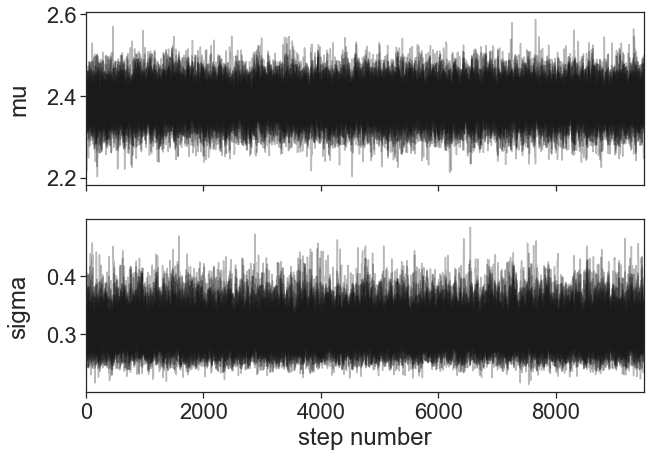

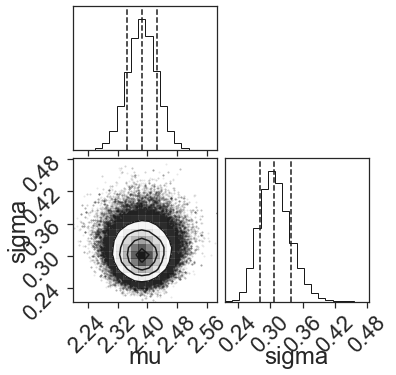

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 73/10500 [00:00<00:14, 727.24it/s]

[2.4742530748996723, 2.552869768539494, 1.862967299000786, 2.2249199221530707, 2.2420836077242385, 2.5039803720851506, 2.626522402228903, 2.3833679366985674, 2.58947356058061, 2.4642097318642824, 2.4385181140136374, 1.5916507948891168, 2.5369843545058277, 2.3181889827448137, 2.320242830857037, 2.54507665463256, 2.1853662208209506, 2.207687647756561, 2.4060130005489335, 2.0061447640804886, 2.309645627061799, 2.278444437964121, 1.9640509829581956, 2.6701261823300917, 2.614270113836711, 2.6106981922532566, 2.340087011428556, 2.573856978753553, 2.4844625865409276, 2.5398991576945322, 2.6034260387004386, 2.6221964893576626, 2.6786074277017144, 2.671574745684614, 2.236324135840091, 2.3114409480492277, 2.6453432669913184, 2.7142582374483855, 2.5678732020307162, 1.7979603922669676, 2.7412673654625737, 2.6948764053755565, 2.3871402134975606, 2.8939173249636116, 1.509902528267748, 2.4874914821335903, 2.4110026646170333, 2.631239477261045, 2.4994104604898317, 2.7405684730479525, 2.023314751747846

100%|██████████| 10500/10500 [00:18<00:00, 558.91it/s]


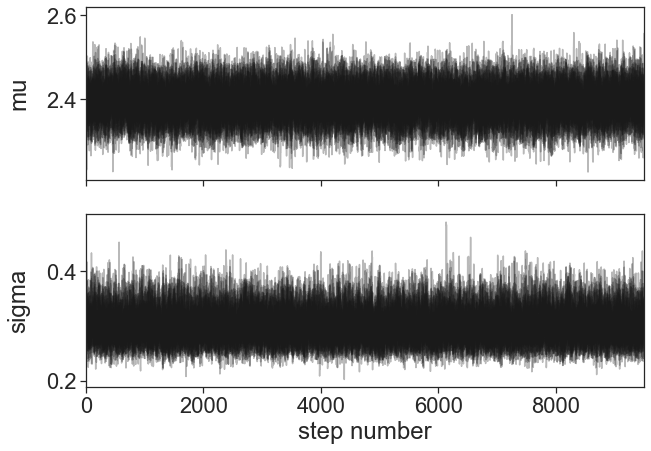

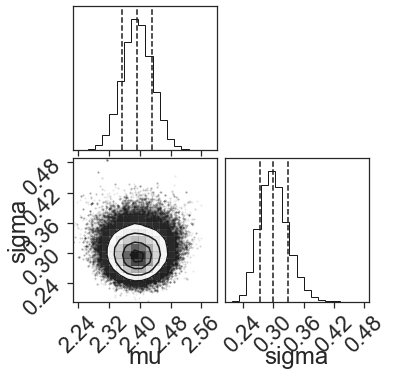

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 50/10500 [00:00<00:21, 496.05it/s]

[2.2739881216820064, 2.4789468647963475, 1.8855511195124055, 2.233075755150348, 2.4053026600604053, 2.4716553650111623, 2.5375295061743977, 2.4526479506860848, 2.51516150891862, 2.2741601639261804, 2.466590921140522, 1.8859603043223432, 2.517806103952771, 2.2883275332123545, 2.3023586739764936, 2.4494974378356194, 2.3101817438023176, 2.276750849354801, 2.3213328334608407, 1.8496483084448923, 2.3267324922978085, 2.279317971202666, 1.8346007750812163, 2.648889328540707, 2.5655545954977397, 2.5530244794821497, 2.301292073289559, 2.5880860978503337, 2.476236262478256, 2.628226949407338, 2.63703052417565, 2.628826248937194, 2.643744358317398, 2.6058456515211113, 2.2908586485072777, 2.3150030518751916, 2.745247345041295, 2.6151147994749917, 2.5467946006499953, 1.8054310583192843, 2.861192460093342, 2.792841882004873, 2.388593038603317, 2.8933605576658894, 1.7107895238634145, 2.537942757529818, 2.4907845550262753, 2.5507103184164204, 2.5976742714087817, 2.586795774288113, 2.115172670003988, 2

100%|██████████| 10500/10500 [00:20<00:00, 520.49it/s]


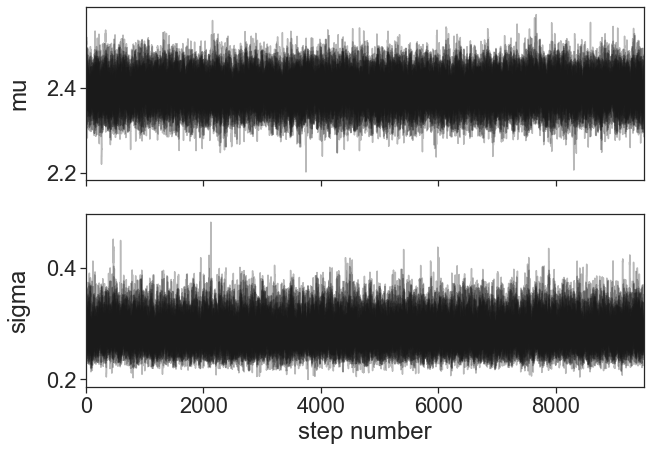

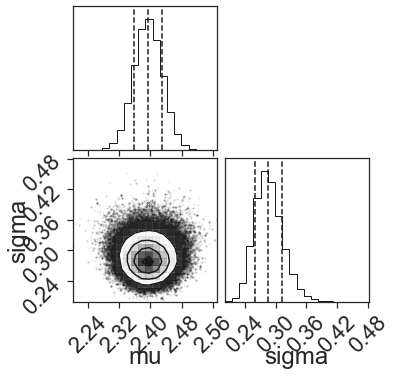

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 51/10500 [00:00<00:20, 507.05it/s]

[2.362873087425947, 2.3811394592668957, 1.9857002771123249, 2.3191088885372335, 2.3726048555331736, 2.4827248703582363, 2.4462341224152646, 2.619643258151232, 2.590478893984971, 2.199059999618822, 2.5038876734938036, 1.6628535794534176, 2.5379733653771708, 2.235139368534891, 2.2256762700323294, 2.4885876142563674, 2.484194310891869, 2.224545719257861, 2.4053786097708274, 1.8288166495371585, 2.38864956914977, 2.2969312494353606, 1.7464914496200388, 2.6470667024103403, 2.5597042561487315, 2.526467536633849, 2.389154014658797, 2.678842670587189, 2.473442669248638, 2.6150367936264045, 2.7358741620436215, 2.588361831555401, 2.7144684244810313, 2.6768937149591587, 2.2950847161294963, 2.2409993976391496, 2.7113803185469445, 2.3717290101108657, 2.559648337290621, 1.75298397227831, 2.7497382541108184, 2.6760266804163026, 2.4179108234904447, 2.8935476054985867, 1.6390226883984225, 2.529640637185425, 2.5067785058308893, 2.5672108272814125, 2.5447150117003976, 2.4985381836683196, 2.077656458840916

100%|██████████| 10500/10500 [00:23<00:00, 437.76it/s]


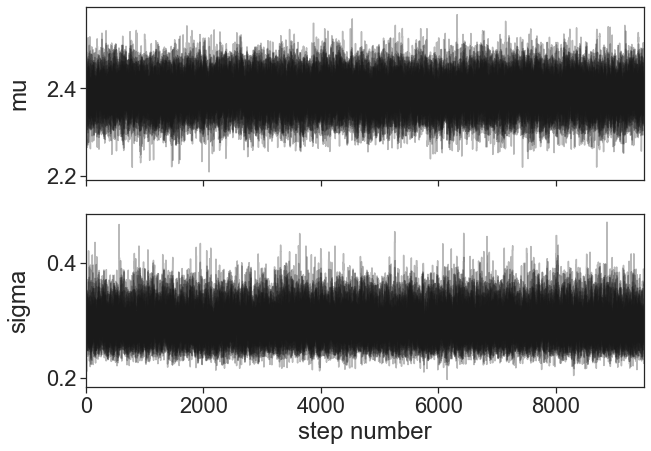

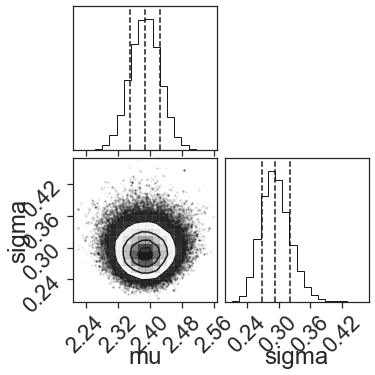

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 56/10500 [00:00<00:18, 554.31it/s]

[2.4457803793826813, 2.46658983093081, 2.000984263771032, 2.2374889073326862, 2.2340192074205, 2.478859960409792, 2.577463636166157, 2.5363003794172045, 2.552686045241312, 2.14306035395873, 2.5687294402583247, 1.8348346990219402, 2.520939953043925, 2.1432022059600437, 2.264977187639343, 2.4793050566712758, 2.3544299223686203, 2.33741470295922, 2.288306617247577, 1.9389187970193882, 2.32755413528746, 2.230461335513645, 1.9131939999732905, 2.7560479496296715, 2.6697157044529605, 2.635006148960126, 2.4665602593388463, 2.6339559225740317, 2.474573078306084, 2.6256220314255057, 2.654773297792852, 2.6080871336329974, 2.6104613918213744, 2.5608903779291237, 2.3098778889025477, 2.2547216087483672, 2.508884647656855, 2.587151577525639, 2.547968571456491, 1.7573793881030721, 2.755456653303689, 2.7299082492993376, 2.403491329428755, 2.894377325827783, 1.6007542554007415, 2.5525495011228885, 2.5159007794013046, 2.6876090046465038, 2.6188268371660683, 2.7685889704562556, 2.167295726418355, 2.437022

100%|██████████| 10500/10500 [00:22<00:00, 473.18it/s]


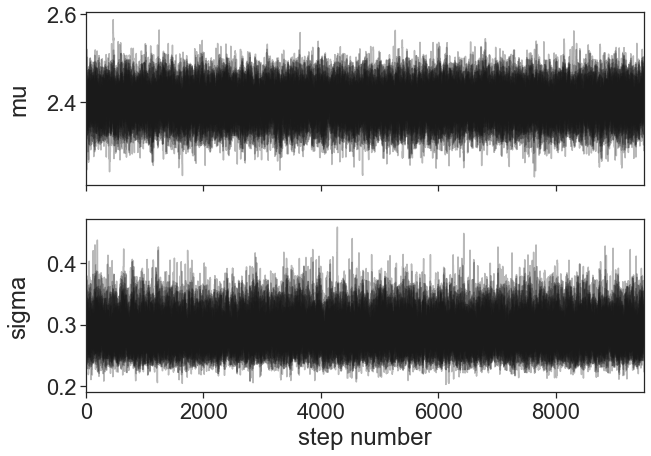

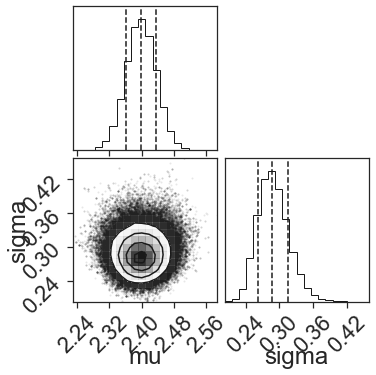

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 58/10500 [00:00<00:18, 575.96it/s]

[1.3560325479949091, 2.3138233383999243, 2.2171480103230716, 2.233970603491905, 2.3014354972185123, 2.4956186489044074, 2.5841213064354527, 2.5444001691718623, 2.5016866503690065, 2.245889537905769, 2.5434966592898167, 1.3118584486100349, 2.518835959310402, 2.1975382988054157, 2.2962315701614093, 2.489129886988496, 2.4132673119468437, 2.133621756976128, 2.333098013621543, 1.866003984563041, 2.2609494830967862, 2.3219318187568194, 1.7513693192854343, 2.7137479281487513, 2.567652814805822, 2.5516061462700415, 2.437343418100528, 2.6346993694889993, 2.467840463117997, 2.589301257986166, 2.809468317190452, 2.6703790082246184, 2.5921732099945474, 2.6306255224693, 2.3475949517678227, 2.3150154623359205, 2.540329097127094, 2.490635173513912, 2.5603880350094435, 1.637781663257255, 2.819904998571273, 2.7610902854806874, 2.41177336331532, 2.893541073007406, 1.4659244591101852, 2.5552457975777503, 2.6329343363543583, 2.6072477806730205, 2.5695375695087885, 2.8151244717396056, 2.0572881487948282, 2

100%|██████████| 10500/10500 [00:22<00:00, 467.09it/s]


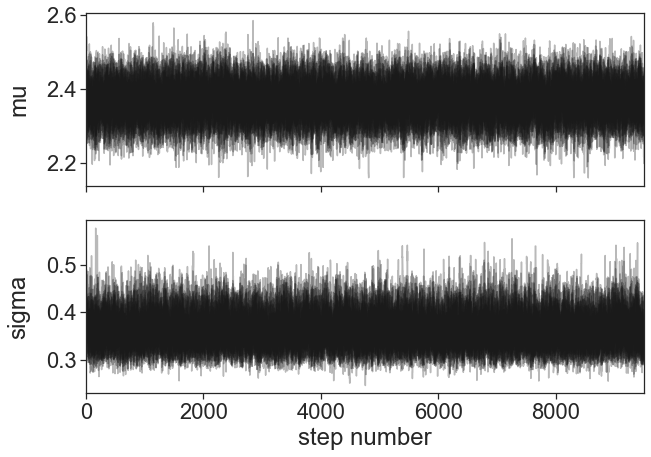

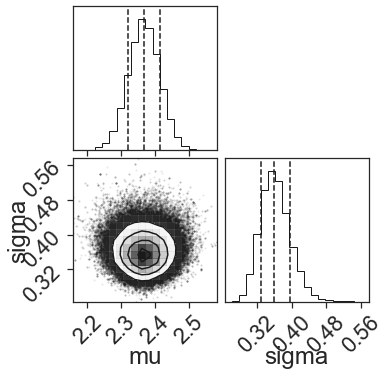

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 62/10500 [00:00<00:16, 617.91it/s]

[2.193422410671541, 2.5104482545747877, 2.111105080557963, 2.190572345556866, 2.3872421556485324, 2.502942914879622, 2.5428994466457535, 2.518080388324692, 2.563876780525392, 2.4561735200845662, 2.5233947876745986, 1.9524527270640362, 2.4810851052325593, 2.0645774235692538, 2.266908808114159, 2.4530421208393616, 2.289701052027079, 2.225482493346579, 2.282184200653068, 1.7403248593278915, 2.3195099481161496, 2.4118701153042235, 1.9545216881130465, 2.674555944694567, 2.514969528745889, 2.555205426816054, 2.393396174519451, 2.5747848615375015, 2.477349544632515, 2.5939404210696186, 2.7621775548577325, 2.436508060860781, 2.724585576982438, 2.6210514855941542, 2.3752674862200824, 2.2950044869268793, 2.601015359134619, 2.562158750213623, 2.5678732020307162, 1.4341032545147017, 2.714855897885498, 2.685453554904053, 2.3964583855086423, 2.8929572508517536, 1.7107920385675945, 2.5353639954799685, 2.576354178505966, 2.6329277040557493, 2.601070265684875, 2.4050092936686154, 2.026850970916866, 2.4

100%|██████████| 10500/10500 [00:20<00:00, 508.92it/s]


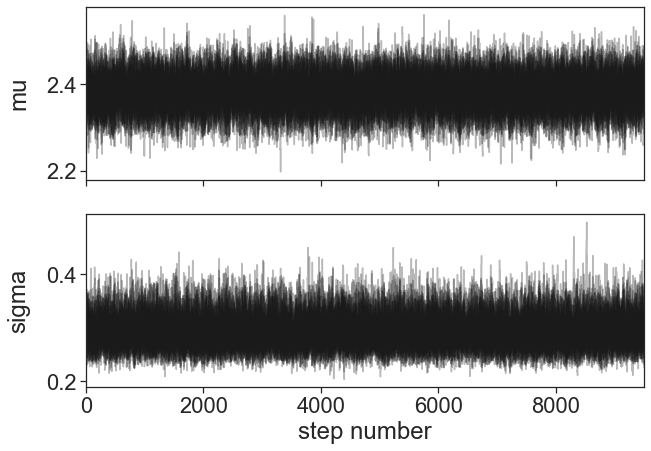

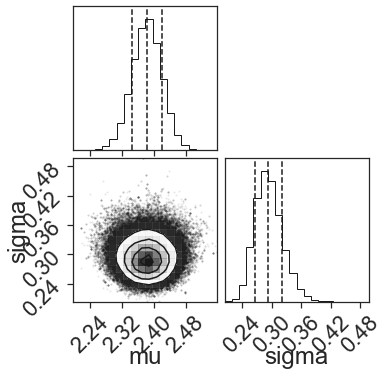

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 40/10500 [00:00<00:26, 391.16it/s]

[2.2287401214218026, 2.4282848273982145, 1.9582744801861347, 2.240151621815721, 2.47967114877898, 2.4722110532119674, 2.5399977148691506, 2.451595701842758, 2.4959226317637726, 2.568728608516773, 2.409610926674671, 1.8747180897718618, 2.4631630686105144, 2.2539487532438907, 2.2917777956434815, 2.5096243390798842, 2.1000706868574652, 2.1899565168889876, 2.345942150449624, 1.8394104781297325, 2.340807752154732, 2.2899578841599677, 1.8381996945088368, 2.682521320092165, 2.561641888007899, 2.5332665046783838, 2.4283935213156784, 2.61220267569818, 2.4615802265721167, 2.5556744924044104, 2.7824267216020178, 2.5793172978776067, 2.574639982079212, 2.5848102626227405, 2.3318732214966924, 2.2120193981146836, 2.5555562978089625, 2.669023391791153, 2.5619683611247166, 1.514946461257128, 2.8006531546955187, 2.759159244370612, 2.3929159036944507, 2.893187881131772, 1.6330383588950719, 2.581509473602173, 2.5319004257106164, 2.605174859222531, 2.589940418734833, 2.7378392729014185, 2.0620876709984595,

100%|██████████| 10500/10500 [00:16<00:00, 623.73it/s]


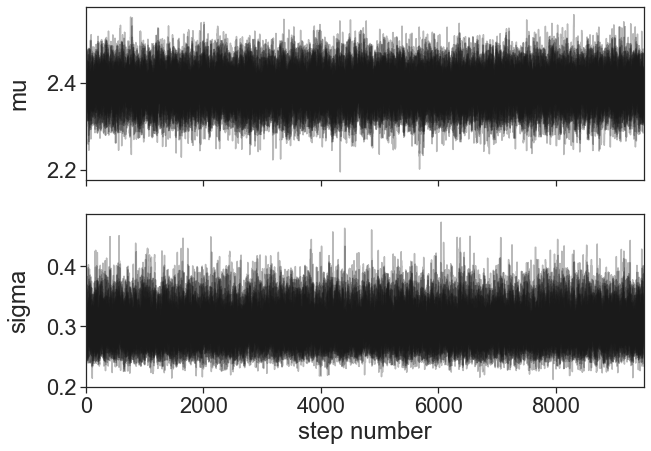

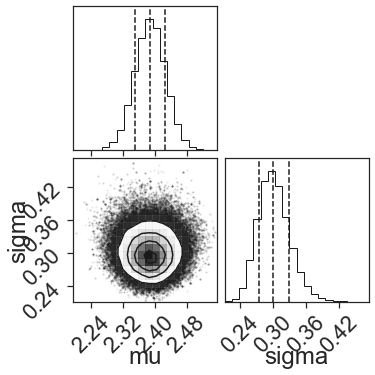

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 49/10500 [00:00<00:21, 489.75it/s]

[2.312824418420521, 2.744928560928037, 2.136695183201056, 2.221289720197469, 2.4664755502936915, 2.5013946755197436, 2.537379699477131, 2.5885698203208616, 2.451911869898361, 2.494953327974145, 2.5876826078498385, 1.9294296752510844, 2.4850148514445602, 2.1352108513797003, 2.241258871977273, 2.527218570960797, 2.2129942717779585, 2.475301367570882, 2.3532910335117903, 1.9959073632341833, 2.364724973309055, 2.2494472799582583, 1.9801055898462625, 2.6978127678181627, 2.528213635977382, 2.4954951868006146, 2.3456672294813554, 2.6507929419673744, 2.454631026661863, 2.619799299636623, 2.80223692911034, 2.725024304957221, 2.6838995215877404, 2.597838641175278, 2.3461202584453518, 2.232345000036702, 2.5283374357064976, 2.6464942402595324, 2.547968571456491, 1.2045697422771977, 2.7728592864391874, 2.6437658392185956, 2.360083486250468, 2.893187881131772, 1.488947167374796, 2.6054762026297866, 2.439985334344361, 2.5855144710778553, 2.5089661366434672, 2.727155328160742, 2.094029375941276, 2.415

100%|██████████| 10500/10500 [00:17<00:00, 606.04it/s]


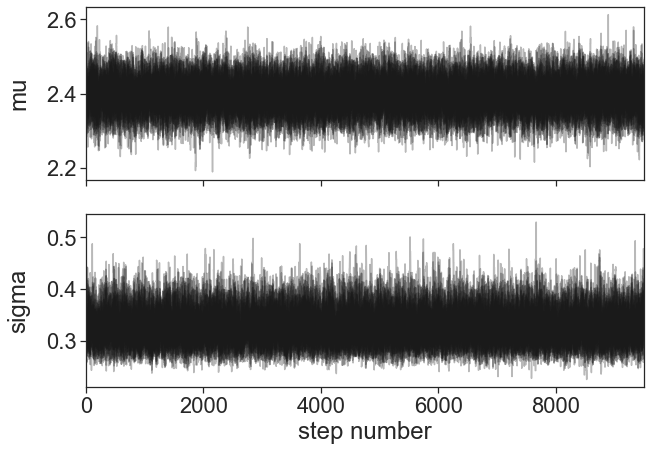

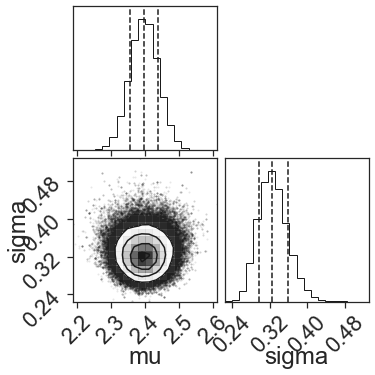

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 53/10500 [00:00<00:19, 529.86it/s]

[2.4213869007970854, 2.628652958345922, 1.8268024464155905, 2.2712438496856038, 2.4323828585157043, 2.4810812983468393, 2.6130899026750813, 2.488407973822672, 2.5091434132756687, 2.6989059749267788, 2.5016712940402153, 1.8914556913879108, 2.4788121082853785, 2.1457804011992634, 2.357498571422585, 2.4896602557061507, 2.4217475945386098, 2.1551728298366104, 2.2917341957875745, 1.8496438171221483, 2.3431546715511002, 2.2943530983260203, 1.6222805852391493, 2.6416498639514585, 2.5300919047758303, 2.533708529117035, 2.432918013557973, 2.6327389460779678, 2.4563770367434774, 2.6274826760771917, 2.76770112437618, 2.580620488974376, 2.653294888148342, 2.7176671496410543, 2.357038757474594, 2.252642782172364, 2.655583508756432, 2.629167601973992, 2.551632951679766, 1.873759745182785, 2.832664794650365, 2.7438666305584976, 2.39290272104642, 2.8933391166336153, 1.6506114733572177, 2.3506061666254943, 2.616327625077681, 2.5436664222148444, 2.5690582868800544, 2.6450297996843117, 2.1124084430895804

100%|██████████| 10500/10500 [00:17<00:00, 584.41it/s]


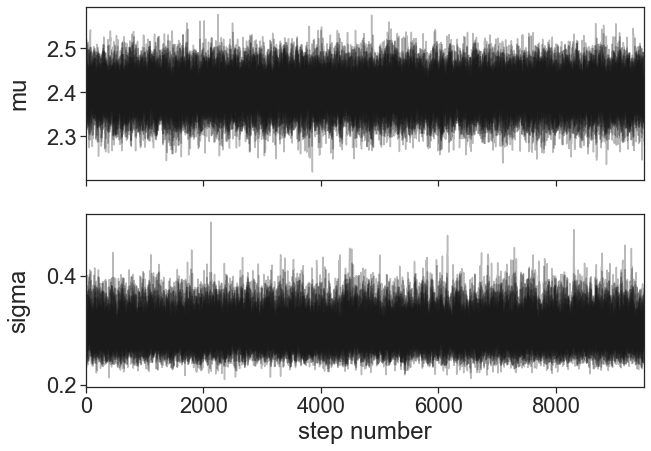

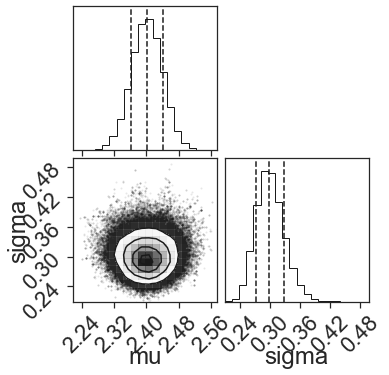

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 54/10500 [00:00<00:19, 537.88it/s]

[2.559470017558579, 2.45268332200817, 2.3258444880433276, 2.238377525876044, 2.1704666607723824, 2.4648519449447597, 2.472288814721223, 2.56452388506444, 2.4835775373863105, 2.603543963318553, 2.503336650459931, 2.0238383061630505, 2.5141837969622407, 2.244130074804751, 2.211618768613422, 2.506563097872373, 2.262840645431678, 2.2318379850020955, 2.295936786318396, 1.9101435623782193, 2.3469469270173224, 2.347686698806977, 1.816013827366072, 2.694036605912569, 2.5035233819832614, 2.471801177784075, 2.4354441364110295, 2.622399602289067, 2.448160491215798, 2.579144607574499, 2.727901306451667, 2.5067813706846214, 2.62386972859057, 2.5079261469099716, 2.3098888059447944, 2.307850024337544, 2.747511271541085, 2.5337057515918433, 2.5584412574001103, 1.5840282181895624, 2.84456131352782, 2.674987837178156, 2.3715801192754653, 2.8930104686985585, 1.6007644655179583, 2.544555638045008, 2.4497282434279537, 2.694969420097292, 2.520896774190697, 2.859987388561944, 2.127268960149499, 2.41132364098

100%|██████████| 10500/10500 [00:17<00:00, 599.63it/s]


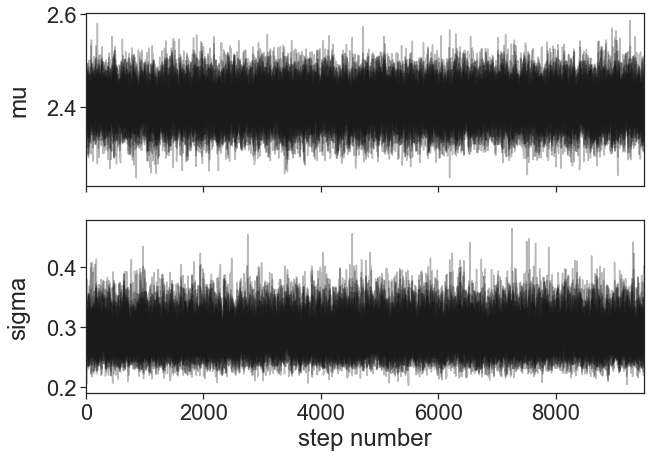

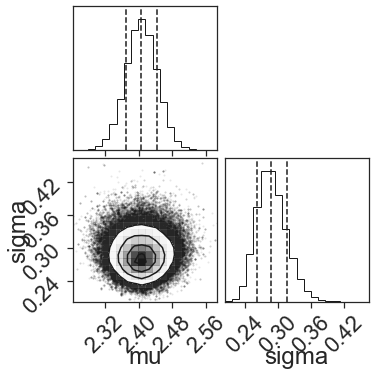

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 65/10500 [00:00<00:16, 649.39it/s]

[2.000481854927463, 2.5583896070423346, 1.9694671724556496, 2.2267779079198946, 2.3640813870154433, 2.512212552397141, 2.5846534150569753, 2.4458622195209863, 2.814880782288349, 2.6353596078698436, 2.4453791563742353, 1.8108812824125093, 2.509975372982234, 2.3115229560053825, 2.287310890032178, 2.4680887647425043, 2.177629833056482, 2.2263751465308244, 2.309320391165554, 1.9852578348305996, 2.3120951653704487, 2.3603154927926377, 1.7746593921854503, 2.6445407037939543, 2.6170418313205284, 2.5342159754191367, 2.396882124509069, 2.6331482710354495, 2.4667148349294377, 2.645199651110963, 2.7697720229777376, 2.5632212778680996, 2.7512894781889625, 2.606310449296195, 2.3090741507227515, 2.2345200916859076, 2.6123563109290218, 2.5988262013042918, 2.5603880350094435, 1.7439125548659753, 2.709450748945416, 2.707476362334932, 2.3936310687910476, 2.8929572508517536, 1.5791507641516684, 2.4148085969592348, 1.944610983188314, 2.630857969552963, 2.5224187202001414, 2.3315886252177633, 2.05729393095

100%|██████████| 10500/10500 [00:18<00:00, 555.25it/s]


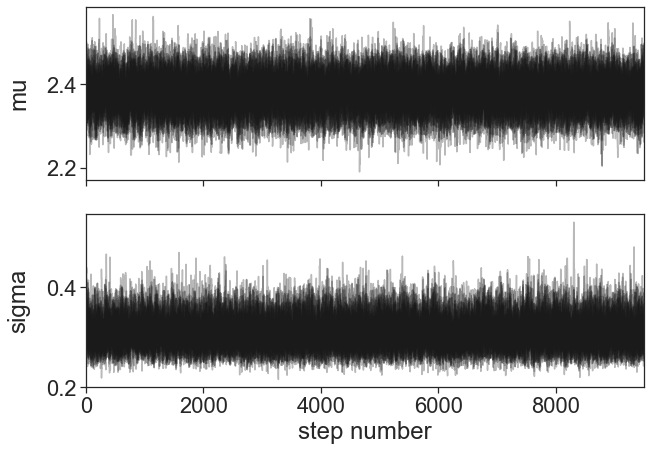

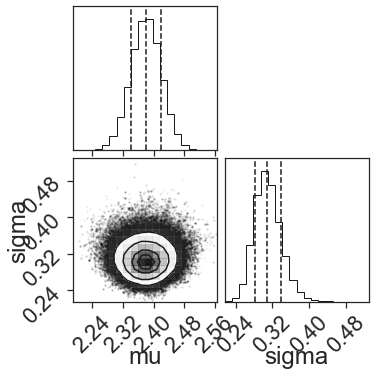

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/10500 [00:00<?, ?it/s]

[2.2204984876327005, 2.5621087835405367, 2.2098052285938357, 2.2212974657862015, 2.416235904554348, 2.4659506621351737, 2.503637454121032, 2.588297734171288, 2.5266526982117146, 2.3370480390092463, 2.4945978258235564, 1.68661213928461, 2.517806103952771, 2.34366204115977, 2.2562467783415485, 2.5759899799809585, 2.280465177430768, 2.1909860178580445, 2.2865848562364253, 1.802313428106087, 2.2925872102908147, 2.2739141278473096, 2.060816329250149, 2.6253730901514936, 2.583391561191138, 2.5704804268640875, 2.36872965408965, 2.588490391218826, 2.453461217796545, 2.5773787418603282, 2.671956839535582, 2.609732064133273, 2.653187700070146, 2.5678205080093464, 2.351261415738036, 2.222310794869455, 2.7166846373623006, 2.628843637992644, 2.551263441053968, 1.6512171955263737, 2.8426801573372247, 2.655188704121796, 2.3530284127057093, 2.893187881131772, 1.4659860443410946, 2.5262331171313743, 2.5104276070446216, 2.5279075036147045, 2.5329584814698167, 2.750486290972407, 2.1879985655041665, 2.408

100%|██████████| 10500/10500 [00:18<00:00, 582.95it/s]


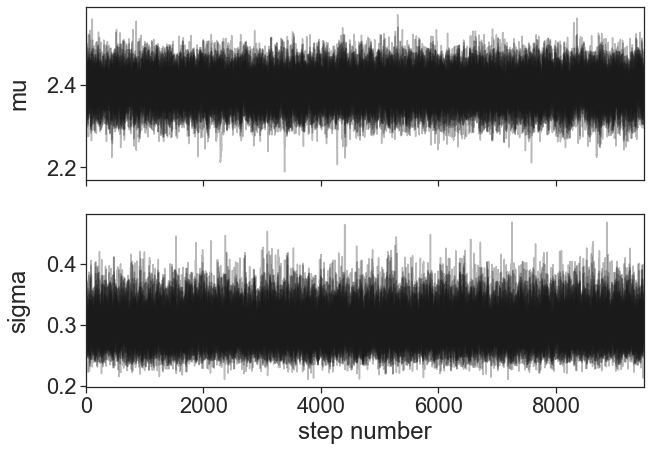

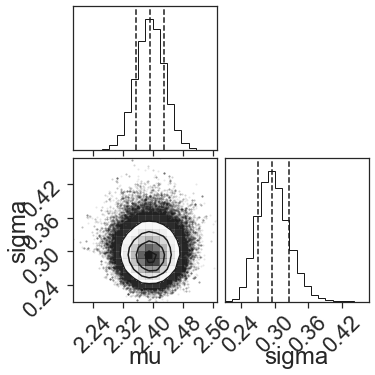

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 60/10500 [00:00<00:17, 598.39it/s]

[1.8069748953081797, 2.407072093157213, 1.8495578959769505, 2.263078662551, 2.371199094987197, 2.460830991464051, 2.517589064342937, 2.561124079645918, 2.52395524815189, 2.4037744206618417, 2.381545690855309, 1.7030769312336485, 2.5452922519259724, 2.3949400756878965, 2.2640137181792537, 2.517278769303718, 2.2211106827286575, 2.23363835015741, 2.066966807004299, 1.817700620637535, 2.3235926157999174, 2.2926226946854853, 2.332538474845181, 2.717097735635178, 2.450294647245313, 2.5151275466149543, 2.3440803876188925, 2.664478921855995, 2.481729198329311, 2.586826500901379, 2.8430771055699604, 2.5788568840471626, 2.649048082311075, 2.7134561954805396, 2.3512425912422836, 2.2267847690439306, 2.7636435788467404, 2.5899538361498338, 2.5599990079568316, 1.5924953678077716, 2.7348113209666844, 2.6971406739427985, 2.372345273156629, 2.8933443139110073, 1.6206120728675497, 2.5382635396732143, 2.4671117689426674, 2.5244237721170006, 2.5704363857867034, 2.1990484652168414, 2.105448158751656, 2.421

100%|██████████| 10500/10500 [00:18<00:00, 580.49it/s]


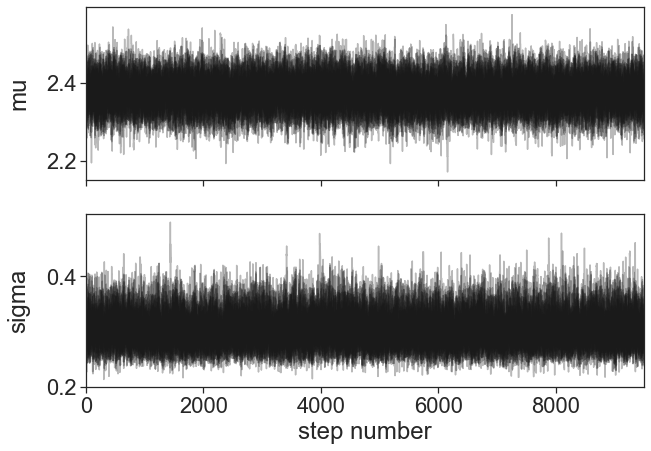

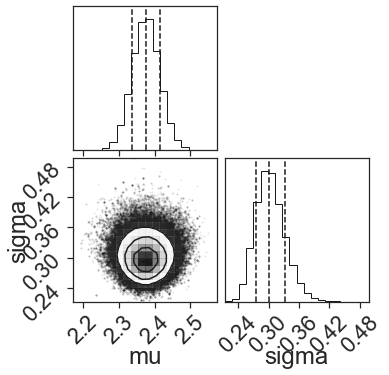

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 58/10500 [00:00<00:18, 574.05it/s]

[2.376459078209025, 2.5884131540487205, 2.0125211436459387, 2.3052703262497327, 2.355968791367777, 2.4631401874504912, 2.5448241441195294, 2.61205722725047, 2.7790929023862256, 2.5646316107629703, 2.4216792845500863, 1.7423488471665283, 2.5198583939724415, 2.29356831282202, 2.2890890113747964, 2.4404860960128265, 2.231027849999679, 2.1735552719971745, 2.371888815305652, 1.9720068899880245, 2.363268089472476, 2.260906258226863, 2.0711916504190855, 2.683509032820684, 2.5702595888377258, 2.4794626575734044, 2.393388426379937, 2.6255828805209793, 2.4833662577883477, 2.6406749771317424, 2.72188623537332, 2.5901315187503, 2.660449421967498, 2.639527942262521, 2.305029638147959, 2.2659362233056375, 2.849821171251912, 2.510403585790507, 2.544220308049959, 1.6446160418480713, 2.754709149191512, 2.7006669985354206, 2.3600818675553623, 2.892967794883864, 1.6506001886879866, 2.58879123901953, 2.587907722390165, 2.707003311462813, 2.506336295640486, 2.4336759972524056, 2.098360633911014, 2.39953520

100%|██████████| 10500/10500 [00:17<00:00, 610.06it/s]


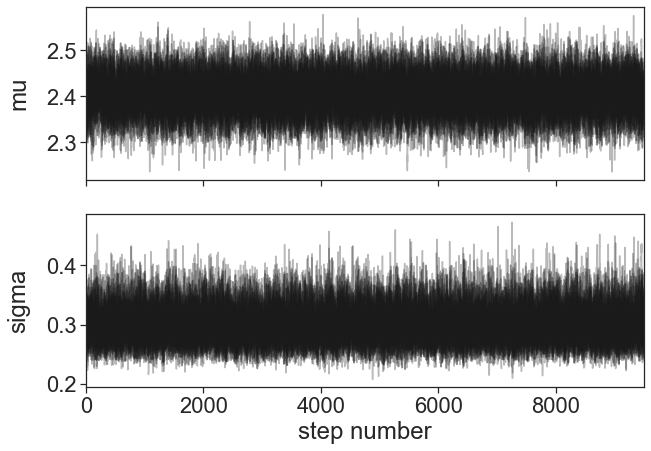

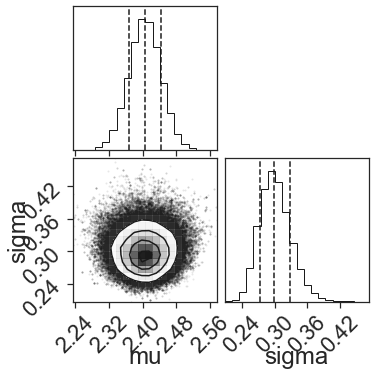

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 30/10500 [00:00<00:51, 201.95it/s]

[2.258208426415792, 2.6653838420542764, 1.8706513017399886, 2.222171146466445, 2.4856236172996997, 2.4497795839785503, 2.5859161039506007, 2.632536965715776, 2.571404299373541, 2.6236061586298423, 2.515080300149402, 2.012983141831169, 2.4759696212568096, 2.1683146857951128, 2.281842316471295, 2.544548439107175, 2.366396204505064, 2.1105192087445586, 2.2596664603873484, 1.976519710949554, 2.355189266890041, 2.3235262848926506, 2.0016697169619673, 2.636150174215711, 2.5860982099973513, 2.589411882418086, 2.401056105697287, 2.637374252765929, 2.469540611498327, 2.51701467597334, 2.5561742188599537, 2.573135627862743, 2.6433447271727575, 2.5490790733712285, 2.2770543553470786, 2.2768540364989933, 2.588418152289223, 2.647496244991432, 2.551632951679766, 1.4496771185942259, 2.7587516357738346, 2.6958866496922598, 2.3914353582217815, 2.893162984564079, 1.682448247603733, 2.577652242064435, 2.533395959060496, 2.6028500590541457, 2.5504160858007543, 2.5062831085076, 2.063699814590977, 2.4113273

100%|██████████| 10500/10500 [00:18<00:00, 558.09it/s]


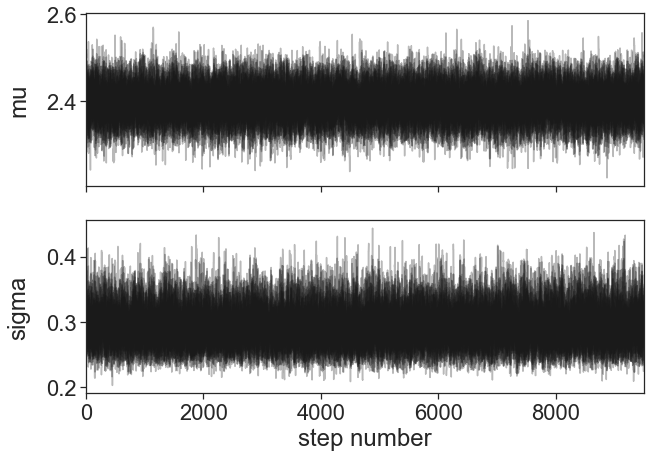

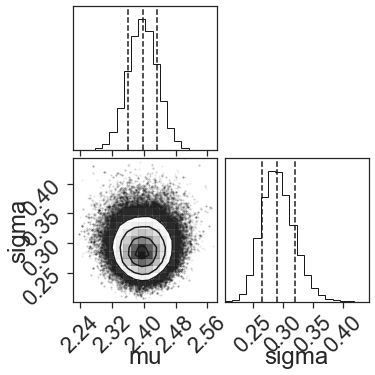

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 62/10500 [00:00<00:17, 612.07it/s]

[2.3136325652694896, 2.633693808010937, 1.9675789881632328, 2.234854081251391, 2.4596288011814718, 2.49398726243623, 2.553550655260474, 2.531277552518277, 2.581990714886528, 2.3484766220607103, 2.4359714376307, 1.636710664207323, 2.496044856877719, 2.2738567897965405, 2.3498414574182496, 2.5417666828805703, 2.2955700152673146, 2.201874613041682, 2.3760621855121493, 1.9209363144407026, 2.327546441141999, 2.279325928979296, 2.051932245282547, 2.7091463473599595, 2.526867872555669, 2.5393518625616904, 2.468320629218286, 2.594528229121897, 2.493590685030355, 2.630626777235122, 2.6972364798037374, 2.563227705203323, 2.5691973207289593, 2.5844612801371403, 2.330355913979538, 2.2748808837008845, 2.2812542484551463, 2.5016595456736725, 2.5455074845622687, 1.7824496305886408, 2.760198146609358, 2.7471091004608437, 2.35459710757573, 2.8933443139110073, 1.6330437696569233, 2.553744331155954, 2.457863191319599, 2.545670370998156, 2.491779036885582, 2.770707660663953, 2.006830973773485, 2.381167675

100%|██████████| 10500/10500 [00:17<00:00, 589.03it/s]


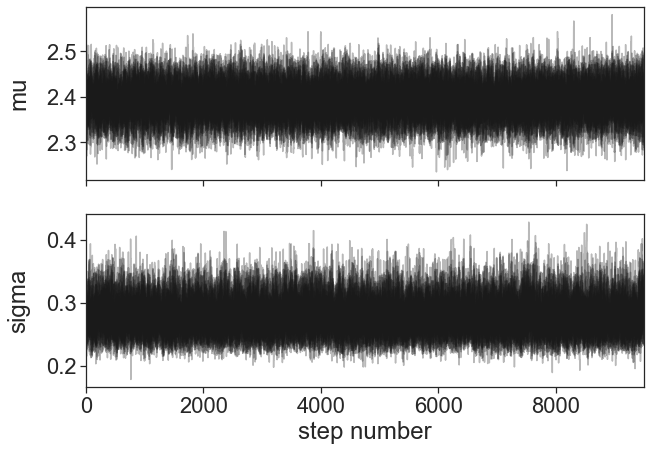

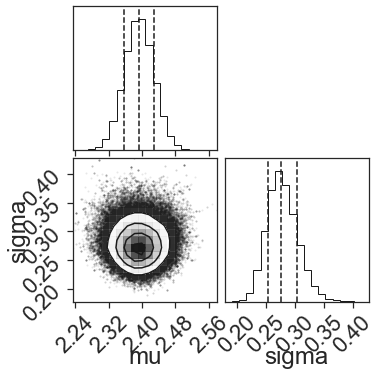

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 60/10500 [00:00<00:17, 597.19it/s]

[2.348948558169352, 2.561078837987939, 2.0251268369842186, 2.070892623782607, 2.335585721987998, 2.437764503876443, 2.617940166117996, 2.4791614983176564, 2.7099766690439826, 2.7269163285832803, 2.4918169371896632, 1.5996890922083586, 2.5178047936045527, 2.313181400940285, 2.310128758387656, 2.468081129959891, 2.3045039853879308, 2.3255525734642326, 2.2651744471159563, 1.90462190505886, 2.361812700233003, 2.2628036152095605, 1.7258919736420766, 2.734410390952019, 2.643091236760094, 2.47622156926507, 2.504690123814276, 2.6236619075422905, 2.460424101345333, 2.6790961600238385, 2.674811723473019, 2.6707424847205647, 2.709235322550433, 2.6532868005364527, 2.2450088041627034, 2.2884129611067303, 2.574224398097431, 2.6792890523061215, 2.5535881125688813, 1.5924500400457648, 2.7783590950983235, 2.6999295368169007, 2.3856710357452005, 2.893162984564079, 1.360801375084015, 2.438008218400011, 2.464669012570002, 2.576392392797699, 2.4790186939537184, 2.738126959069612, 2.2128780118412714, 2.4028

100%|██████████| 10500/10500 [00:17<00:00, 595.54it/s]


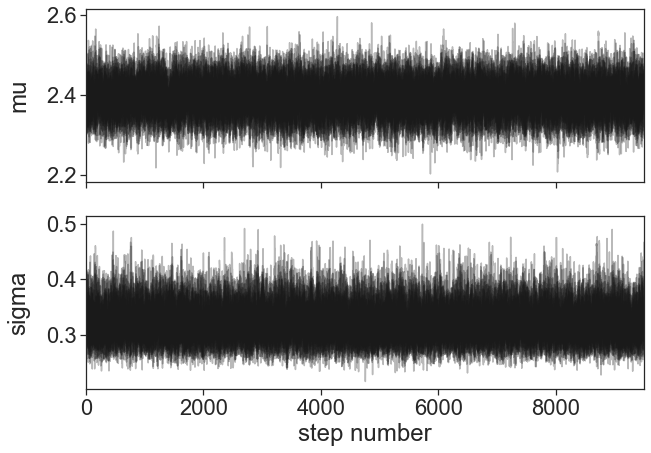

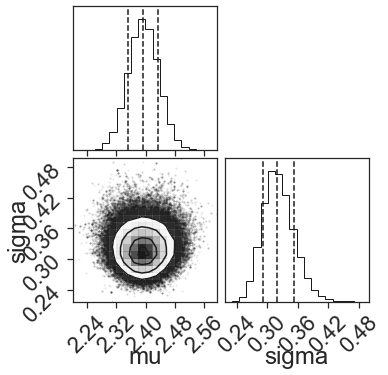

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 41/10500 [00:00<00:26, 398.54it/s]

[2.0673318414608417, 2.5031384947283706, 2.208958785379528, 2.2776812853335624, 2.450346015062183, 2.477214411632433, 2.5434715944595774, 2.3637023084504385, 2.4936028648214363, 2.300465741226184, 2.600372113789768, 1.643431882815127, 2.5413710073554983, 2.4049988840166896, 2.281821469820471, 2.503942369206414, 2.401386775668226, 2.264565846680241, 2.5296914129593078, 1.995842146054876, 2.380358856819105, 2.2590076195650752, 1.383473614245435, 2.6524357848586786, 2.646770905111417, 2.6267556591673626, 2.413971684260024, 2.7003737723885592, 2.481739317770169, 2.592549650562664, 2.7645426656199534, 2.490258231046376, 2.630507835408414, 2.718946287287399, 2.275281089289468, 2.258824631058872, 2.6946490779345535, 2.3918087455671584, 2.5487235785616895, 1.676233900214625, 2.774855263346807, 2.6703130484938087, 2.3593181228486735, 2.892939147344975, 1.701684838429259, 2.4148494908295652, 2.5851569533869103, 2.59732063956504, 2.5299714990127797, 2.7926023916189058, 2.0997784166339044, 2.43520

100%|██████████| 10500/10500 [00:18<00:00, 560.93it/s]


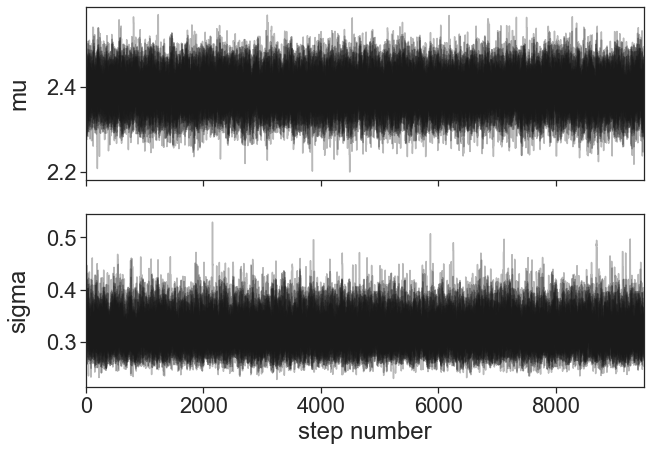

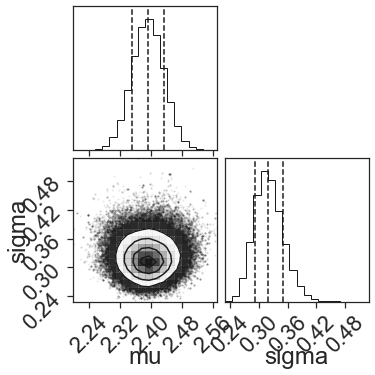

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 54/10500 [00:00<00:19, 536.41it/s]

[2.3562883519245386, 2.4744716095086496, 2.1790699714693305, 2.253041953551036, 2.224816358124887, 2.474983657554159, 2.536012695193807, 2.536873500169771, 2.4872471024296963, 1.8352208684868097, 2.4828448563501726, 2.124811514548622, 2.4987818940253756, 2.5033577753632743, 2.241262349179793, 2.4954622381523195, 2.2348997502219037, 2.2853896731186154, 2.3910036401536567, 1.7983337719020123, 2.336965539858943, 2.271157583821343, 1.8961313588000932, 2.7315341008257956, 2.56940339359637, 2.512541357635753, 2.357351783604833, 2.6848055825069013, 2.4767904183269414, 2.553804825463016, 2.87447605639169, 2.5888494940065385, 2.6786074277017144, 2.6849617621138395, 2.371812371688294, 2.3229153352541245, 2.7931791623867506, 2.432528216515018, 2.5467946006499953, 1.8464098613488364, 2.7084503928234493, 2.708206147014757, 2.3662471932627036, 2.893726159067699, 1.6007558107483093, 2.5798315905604667, 2.5749711547416454, 2.519385979398959, 2.5193583517907214, 2.644994177319727, 2.088180676287022, 2.

100%|██████████| 10500/10500 [00:17<00:00, 615.16it/s]


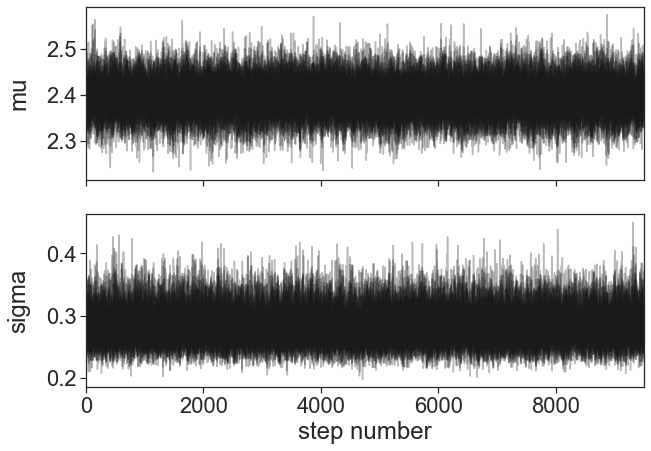

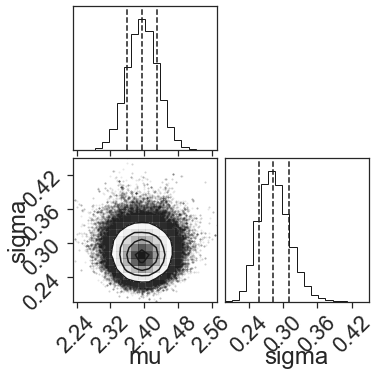

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 8/10500 [00:00<02:33, 68.29it/s]

[2.404814287300067, 2.4893691195994414, 1.823917681320197, 2.2572795877004594, 2.361144054315805, 2.509658383207859, 2.487608252165948, 2.6079048004357426, 2.5415453134434665, 2.2384306750916325, 2.3536528811178687, 1.7961831821836607, 2.4643550924856585, 2.3206146270768198, 2.182978456623965, 2.5880973161793035, 2.249159053447651, 2.5364234481107246, 2.2733381118765394, 1.9809158540744385, 2.3661841250662223, 2.2532965083546075, 2.081226911096684, 2.6564459014887354, 2.543607071659656, 2.5778528812149797, 2.340883215744484, 2.6110034535987294, 2.4717818955832467, 2.5302629815742925, 2.8241915905723842, 2.601904301052295, 2.7210638347833798, 2.5918714418272604, 2.3050066535965237, 2.2912371481267844, 2.6595160084478118, 2.5851818455735267, 2.551632951679766, 1.6308127164188935, 2.725358744726817, 2.7726955331310874, 2.3593123249284815, 2.8930854361895184, 1.6141704852078227, 2.564409638062665, 2.498987571114927, 2.6808337654187078, 2.4906922469296595, 2.5513383883814242, 2.117866908157

100%|██████████| 10500/10500 [10:43<00:00, 16.32it/s] 


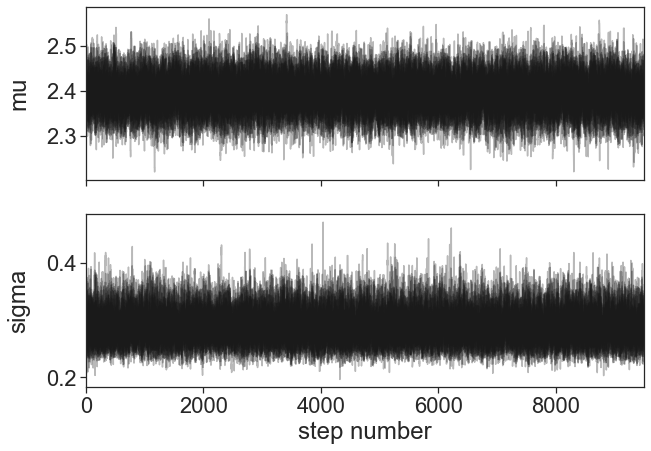

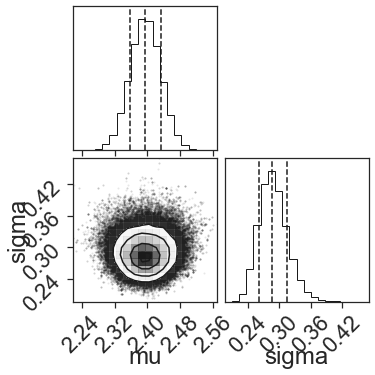

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/10500 [00:00<?, ?it/s]

[2.0193719969337303, 2.535834231940172, 2.36110599751196, 2.2522021636888363, 2.355234392837037, 2.4573660856329904, 2.647142847406987, 2.5550499613591016, 2.6145717049567962, 2.3644003067041877, 2.4945645728147463, 1.9198982491657746, 2.5105160548594516, 2.3131556027137874, 2.2392323110932972, 2.460054246598761, 2.336308755265879, 2.223646605003988, 2.2236744416436287, 1.9128275814673583, 2.3330826551823467, 2.3121060446079085, 1.9186380992526666, 2.6207636797726916, 2.449954439390983, 2.5651757902242616, 2.492738760246785, 2.6047673565347496, 2.4695385355866875, 2.5277980214103812, 2.6856458972008004, 2.560465353640113, 2.6981289296013378, 2.558609230333727, 2.364850262392868, 2.24739488602317, 2.4903743239520018, 2.622174483832256, 2.550809691423323, 1.6005943216190552, 2.7885666167572767, 2.678412097562563, 2.361637919990232, 2.892939147344975, 1.571498203168757, 2.4049392906028566, 2.445817764788739, 2.648901903434143, 2.5816329744954376, 2.6587648927725946, 2.121937083130275, 2.3

100%|██████████| 10500/10500 [88:35:15<00:00, 30.37s/it]      


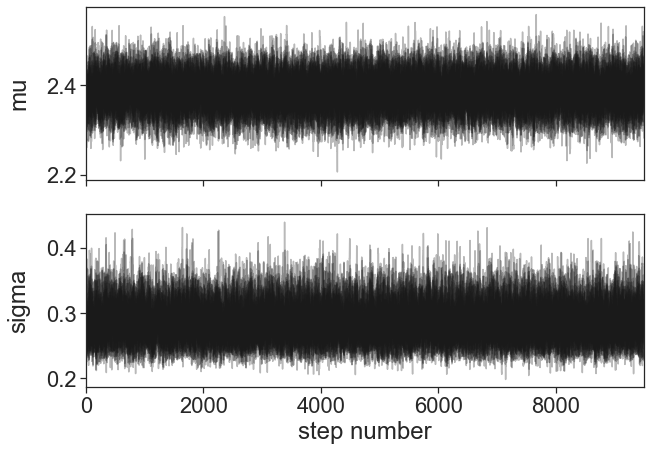

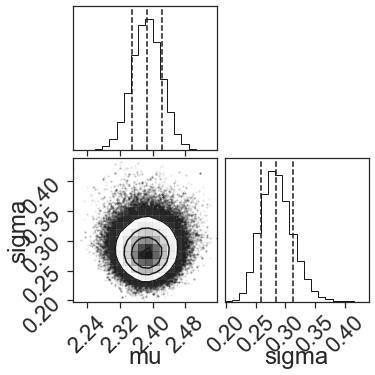

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 9/10500 [00:00<02:25, 72.08it/s]

[2.509576063319032, 2.539683250722639, 1.9820407810987777, 2.260623570548875, 2.4474739262546916, 2.48431321150088, 2.60927032925359, 2.525174049613224, 2.539973048631223, 2.180951901545735, 2.5654818231157233, 1.7924634369506847, 2.47993700262765, 2.1188738239875664, 2.264971132562586, 2.5157811559195977, 2.3324523793634806, 2.2578932034891066, 2.4555284894888247, 1.9559277083664905, 2.2062334276249933, 2.28470160346631, 1.7609504932048547, 2.641320163005318, 2.530471739122408, 2.544077173806974, 2.42969206520485, 2.5624644035920467, 2.4517090171699216, 2.6747463438134456, 2.804353674359069, 2.5595831131824522, 2.6262562660195434, 2.6104435428361925, 2.331878058139947, 2.2245648073452395, 2.6428688850390323, 2.628058913792628, 2.5532062597161116, 1.8399691970302847, 2.814688446384754, 2.7482194152463766, 2.358538657474276, 2.893187881131772, 1.5554487964943087, 2.5972927844614895, 2.590248074560929, 2.5461302041321683, 2.4795674482519248, 2.6669735325455797, 2.058879202402567, 2.37270

100%|██████████| 10500/10500 [15:39<00:00, 11.17it/s]


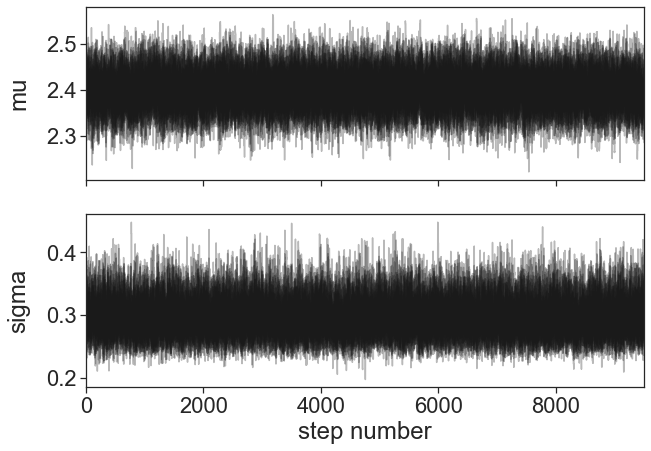

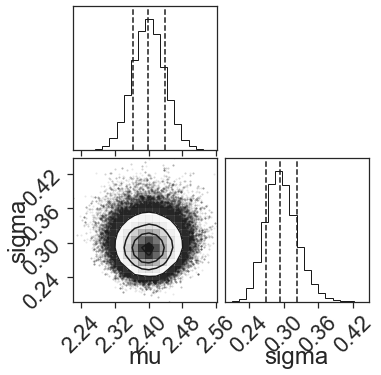

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 28/10500 [00:00<00:37, 279.81it/s]

[2.2045380740689886, 2.6646327238482663, 2.410919799528066, 2.194519601980465, 2.4396829963819986, 2.443209963100577, 2.5611717136754018, 2.599681076774653, 2.3725937134439143, 2.6692593521103554, 2.4907411683697265, 1.1630283937947814, 2.4971297081889037, 2.315729572229586, 2.2412670245463024, 2.4934128951332553, 2.1993754848099116, 2.2459025758942275, 2.2366666074682002, 1.8932585132880255, 2.224295807999545, 2.3567143848553864, 1.5786185779016946, 2.733898325652059, 2.5817539203334436, 2.4805335063202443, 2.434795396154997, 2.647415738163007, 2.4575443992947537, 2.6197645198493893, 2.7855904409447345, 2.570914443378745, 2.678354177773808, 2.6041967052353296, 2.318678805090804, 2.299615435817951, 2.795803450973489, 2.629278447396078, 2.544220308049959, 1.7784295946066082, 2.85600793280307, 2.6407133953220443, 2.390017028906344, 2.8931247434080265, 1.6269050952113095, 2.6807141754075015, 2.588368632025323, 2.540385690744683, 2.4879455583444914, 2.65262469969347, 2.0699646575165787, 2.

100%|██████████| 10500/10500 [01:51<00:00, 94.17it/s] 


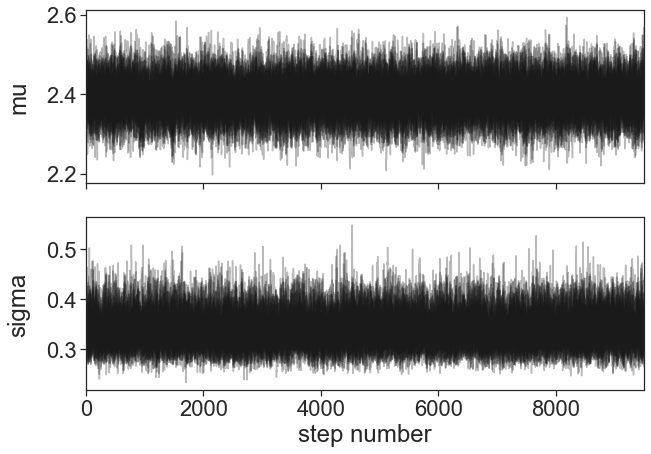

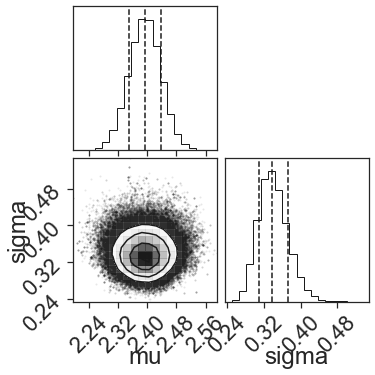

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 7/10500 [00:00<02:38, 66.13it/s]

[2.50406124320153, 2.643894819115285, 2.054883731913748, 2.147147670040881, 2.3933592950343794, 2.4902859907789856, 2.5701670127400225, 2.6082416008035145, 2.540013655021943, 2.5026825681129963, 2.6180175823809146, 1.161855917031504, 2.5198677471758955, 2.300549751621614, 2.2463192752455683, 2.5374579928364978, 2.1346084695235445, 2.324796700240641, 2.224701288885461, 2.029532328816044, 2.3423981096338107, 2.3079385801432513, 2.084495937210866, 2.6580462963154305, 2.5431980721204637, 2.52058984923719, 2.385578006038725, 2.6424311041981188, 2.462720707719535, 2.583843181293195, 2.813929255687403, 2.5558701342270633, 2.629730420064242, 2.540378698934987, 2.237302549614316, 2.2484564296717706, 2.723832222430789, 2.4843395892013174, 2.5516533339074936, 1.7743435233995533, 2.7328248072917103, 2.7260255590830074, 2.3790370599129456, 2.8933391166336153, 1.5715111556204469, 2.463538765551876, 2.5824528770356734, 2.5689807769941093, 2.511584943497189, 2.60493679593735, 2.1151387486692927, 2.398

100%|██████████| 10500/10500 [00:21<00:00, 489.20it/s]


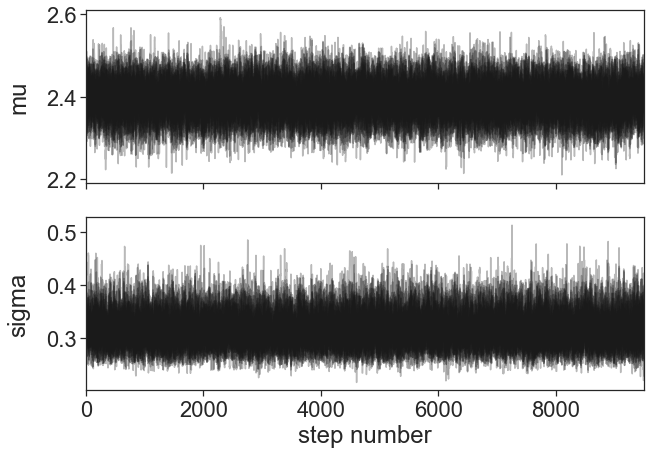

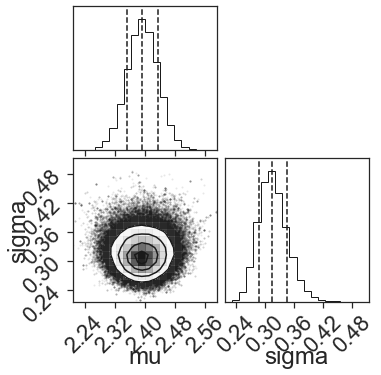

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 4/10500 [00:00<04:23, 39.78it/s]

[2.5111414348776524, 2.438811819516822, 1.9993038472064792, 2.283981203849988, 2.3891352306064846, 2.489224902539597, 2.657684866907594, 2.53174732022811, 2.5404715772045954, 2.6506244666612657, 2.4816673727819447, 1.760084961885249, 2.522432974422949, 2.218415700250319, 2.2926676246395643, 2.4966153489718597, 2.1397067095587663, 2.176639060056681, 2.4033970963297584, 2.0514378406180453, 2.2589991727667904, 2.3210942344027834, 1.9888629362421937, 2.653798346127723, 2.5912376007429807, 2.6110440871445593, 2.4231976635672012, 2.66923749441269, 2.465574872404713, 2.6502999571952492, 2.7314121907278577, 2.6138029081700944, 2.633113718581304, 2.58484082185394, 2.3186784857427973, 2.2940560833740484, 2.620594370493076, 2.5818599061159175, 2.54383998877964, 1.7743535592370963, 2.714860999068353, 2.868037833366241, 2.3585265792714694, 2.8929883860635703, 1.7521751909707544, 2.4960169928102554, 2.6287184371311096, 2.5394561172392445, 2.59341926042439, 2.72801784661522, 2.141530536739001, 2.4067

100%|██████████| 10500/10500 [00:19<00:00, 539.56it/s]


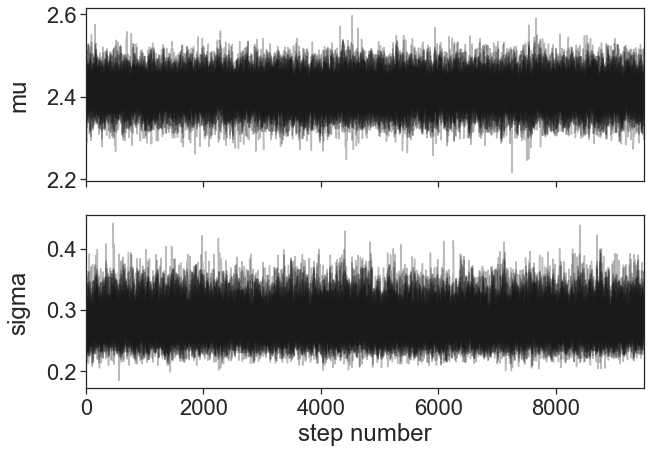

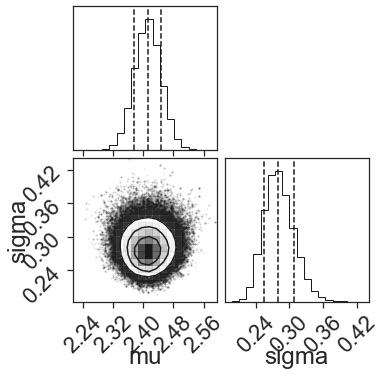

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 7/10500 [00:00<03:26, 50.88it/s]

[2.338267920609491, 2.6324726392506386, 1.8495848529631134, 2.241024632901413, 2.4403379904662965, 2.4897596386883127, 2.512323414100988, 2.600434059523691, 2.4148997607758185, 2.7490769798016226, 2.5171473258582338, 2.03438486839695, 2.505764068180601, 2.331889221400828, 2.326836030052173, 2.579509588485849, 2.255559865958754, 2.0665727706888153, 2.342887588104893, 1.9487280310769537, 2.3071216252098656, 2.2969450246395664, 1.6301455227479558, 2.6865494082584007, 2.584990418394262, 2.5075368334496853, 2.4804319346393635, 2.593269614228614, 2.4667006163024077, 2.661089868934657, 2.6784383800401192, 2.6138266693542054, 2.7209470552420147, 2.6210759242488564, 2.313088284837831, 2.1831345485093903, 2.7267736548279, 2.594070070541862, 2.551263441053968, 1.7148139447399193, 2.7141187677635474, 2.75691249290208, 2.407639179783493, 2.893936292987073, 1.661644235485476, 2.460467939665916, 2.5082117233686687, 2.543698174880498, 2.4873842993424966, 2.6492320675078, 2.057297557718894, 2.401508553

100%|██████████| 10500/10500 [00:18<00:00, 579.90it/s]


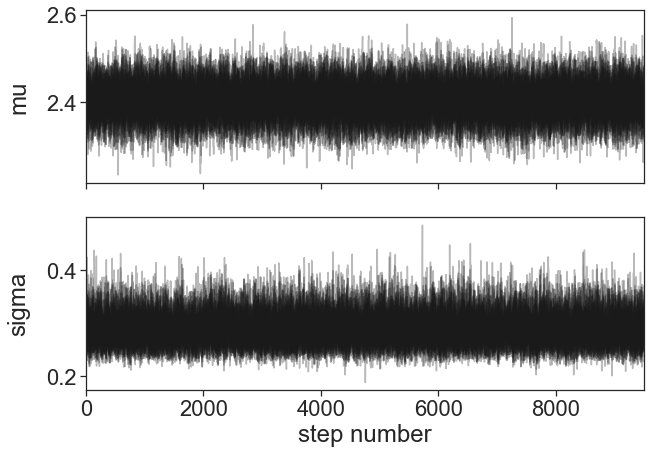

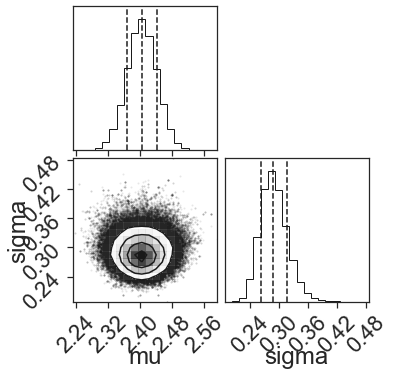

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 21/10500 [00:00<00:52, 200.40it/s]

[2.3045093528316327, 2.53001574323955, 2.1967113882151605, 2.2768752264399077, 2.363313506294045, 2.50546377906721, 2.6937596229169283, 2.615439668053017, 2.5696028102748207, 2.250442982377854, 2.5929761368766084, 1.90465212202425, 2.483325054642204, 2.2205688140195945, 2.226746846402369, 2.5768905495628096, 2.291391620955948, 2.397108600421869, 2.224681635325703, 1.9414133236535362, 2.343133169627092, 2.3369346297530984, 1.652333208087586, 2.6759091490912446, 2.5582352131311947, 2.680425196163906, 2.4010457913604455, 2.650453709160878, 2.4499324177061492, 2.6187201913756586, 2.839108118305187, 2.542681593023457, 2.603365500559337, 2.5557165098694075, 2.263644810329199, 2.274877134660929, 2.615739655726912, 2.4083536899136555, 2.5487235785616895, 1.7529773982530432, 2.7814303234243263, 2.644598966226167, 2.3730892633460994, 2.8952940117509236, 1.6141825816940483, 2.4338083463995352, 2.6079358198375227, 2.4876935216721288, 2.542764714067427, 2.751680234760537, 2.0954982387953742, 2.3712

100%|██████████| 10500/10500 [00:18<00:00, 575.61it/s]


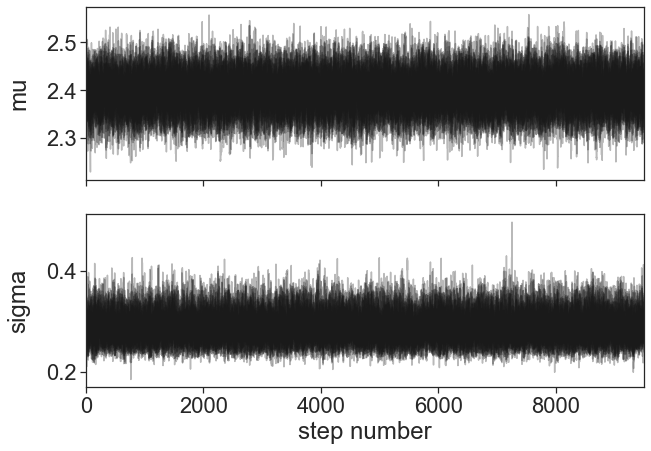

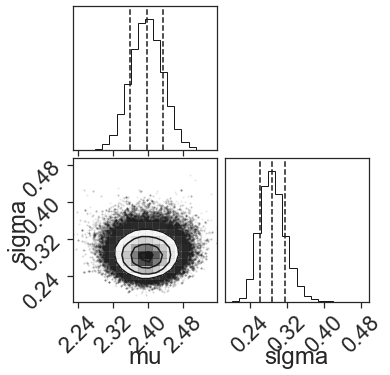

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 22/10500 [00:00<00:48, 215.95it/s]

[2.1456061802290556, 2.600615277927147, 1.923950110401894, 2.3183645386544733, 2.5025409276949784, 2.5106735310316415, 2.6013081273810745, 2.5917696780820303, 2.6241839917417717, 2.45129811866563, 2.4410019176368163, 1.574634369739439, 2.459620497004647, 2.29613829806918, 2.328433926521183, 2.4343689736714746, 2.3566769128486342, 2.198935762692337, 2.295969017916366, 1.8691614105281347, 2.315386840025794, 2.3514505146086915, 1.7036433326183023, 2.649242625505113, 2.6178561163174376, 2.452889565020347, 2.3926860787337985, 2.6022548540359693, 2.4493508343206187, 2.6543401827376782, 2.857869184992256, 2.5310571541125846, 2.6727317879272277, 2.558111278407795, 2.3416918351479215, 2.281715490846371, 2.686039261330134, 2.471743693980489, 2.547968571456491, 1.5470182192887616, 2.774373981016659, 2.7345414702430606, 2.377586489040602, 2.892939147344975, 1.4659666250807306, 2.526129587313209, 2.5869692349062365, 2.6031104315302027, 2.4399111636359896, 2.733109658193342, 2.170819857229093, 2.409

100%|██████████| 10500/10500 [00:16<00:00, 624.43it/s]


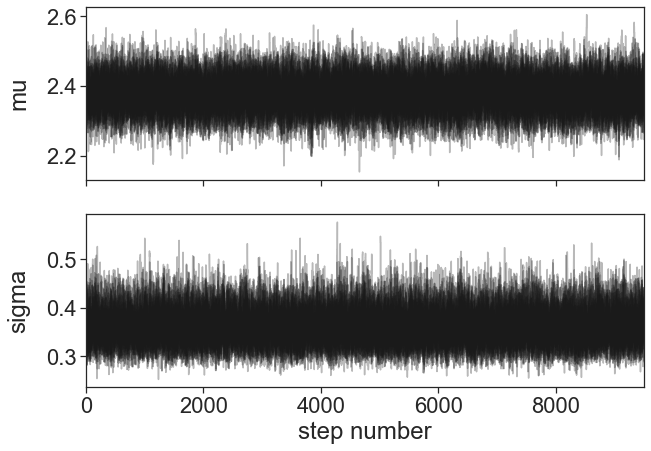

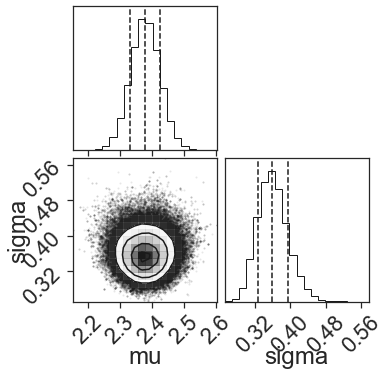

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 8/10500 [00:00<02:38, 66.40it/s]

[2.326583750932325, 2.4561550525552494, 2.2225408062747944, 2.2240081775591225, 2.3906523936968105, 2.5013640738114806, 2.662269047069177, 2.5113780629892806, 2.5833912071298837, 2.3207543277594835, 2.4654520849142036, 1.7807786061880955, 2.537514501042384, 2.305597637563482, 2.1696806147335783, 2.4853155442897625, 2.3622685252181435, 2.3820473621083305, 2.2577972080225233, 1.8961714309287847, 2.3037836978200192, 2.336938236067918, 1.770168282352536, 2.595592602468247, 2.40094881661295, 2.5646788222853845, 2.395524667079828, 2.6268543116261713, 2.482813326129365, 2.5659722039608943, 2.741874482272553, 2.5823331274599224, 2.7161352269302523, 2.618227493666258, 2.328036541125084, 2.236689454071628, 2.774997637781938, 2.647978898343406, 2.5608082221572164, 1.651208465193229, 2.6832587767471807, 2.728951234107557, 2.3900185871166117, 2.8943695228980695, 1.465923150733165, 2.626243507703635, 2.5349784224557323, 2.653670737010623, 2.537418536507293, 2.7763560480858165, 2.1026417473183416, 2.

100%|██████████| 10500/10500 [00:17<00:00, 612.80it/s]


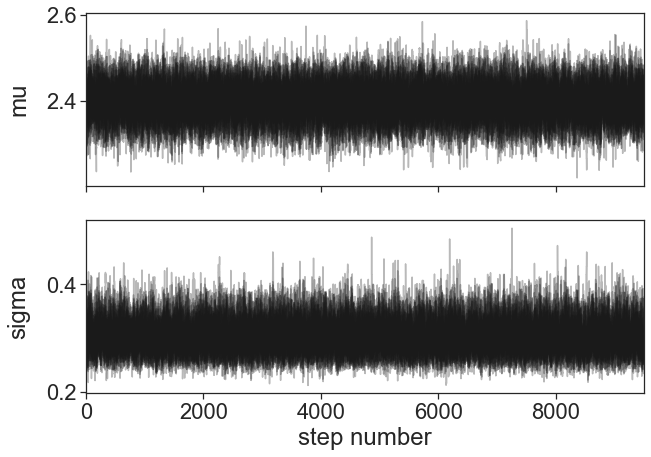

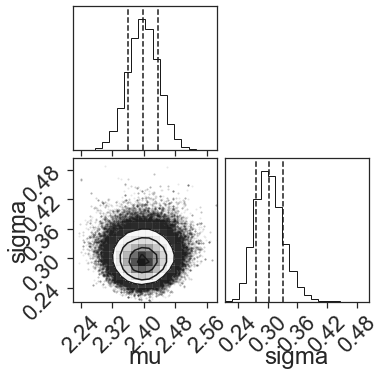

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 7/10500 [00:00<02:32, 68.59it/s]

[2.3792474073243643, 2.3950455178052, 2.1322058610021646, 2.1549308473584996, 2.2185362618668547, 2.445632326660692, 2.516488980626827, 2.5412748288571385, 2.582029619593325, 2.3076628667869588, 2.4034928191303617, 1.9435077753219012, 2.5472402589052505, 2.3632016197343866, 2.2762965038418783, 2.5336177254139414, 2.319666888060105, 2.3290932834342803, 2.3284625561354027, 1.9313351801212584, 2.36976968435788, 2.3162186728414387, 1.7149939976673245, 2.7103407738389538, 2.5557657421428246, 2.4767239889319432, 2.2471631002701558, 2.56289399088145, 2.466702965262821, 2.5455258386158315, 2.8607173099907914, 2.6445217254669484, 2.6648103461377346, 2.607088062637678, 2.382058684646917, 2.2557605333070967, 2.250807120809944, 2.5702513264948714, 2.5678732020307162, 1.600591991333903, 2.690780372032019, 2.7323464569826377, 2.3731075436754296, 2.8933276905547256, 1.6448758483056365, 2.42311733855348, 2.495418188082336, 2.679801554873583, 2.5566004247043552, 2.657089086051515, 2.0925630705874885, 2

100%|██████████| 10500/10500 [00:17<00:00, 609.03it/s]


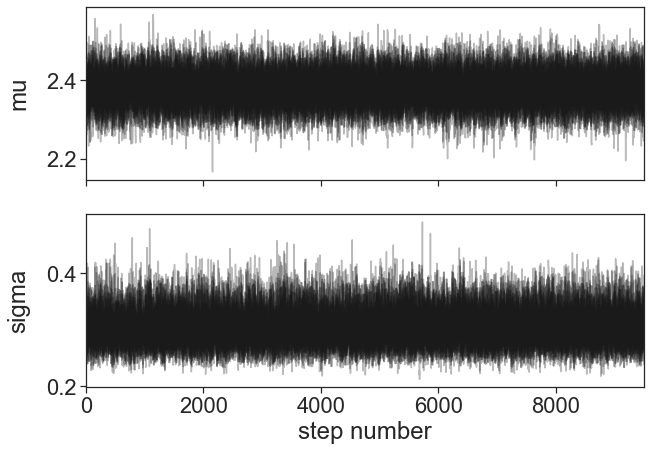

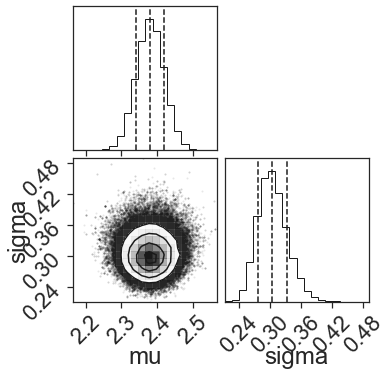

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 12/10500 [00:00<01:29, 117.74it/s]

[2.3257972352902088, 2.4716947192143595, 2.100013379754465, 2.2366334642815273, 2.377463814480788, 2.477734261271239, 2.616012426715551, 2.571280518375451, 2.532517033845166, 2.320716160966326, 2.520298556617913, 1.7330743539619604, 2.4938432234256402, 2.322234460318864, 2.2799983884321664, 2.5393861527285537, 2.2005702289193447, 2.2587525091028415, 2.2715478759450054, 1.9874114841691257, 2.3431550789969164, 2.220122825486354, 1.9047577891835215, 2.7442462935093452, 2.55620974771853, 2.5100258870085885, 2.3933883284912216, 2.594119553569155, 2.474580357496595, 2.538925275011508, 2.7948798544880398, 2.6787345379866156, 2.6626893369189655, 2.615384401179995, 2.2840139507137804, 2.282669534323724, 2.587876861455755, 2.5433439308911807, 2.5608082221572164, 1.7096556382896835, 2.754696278649664, 2.7776112803463464, 2.3907355450359282, 2.893328828077051, 1.5635928706186377, 2.3963753726621246, 2.5077222441621894, 2.5366207712596305, 2.5079125594699074, 2.409763008011979, 2.1402628091310603, 

100%|██████████| 10500/10500 [00:25<00:00, 404.31it/s]


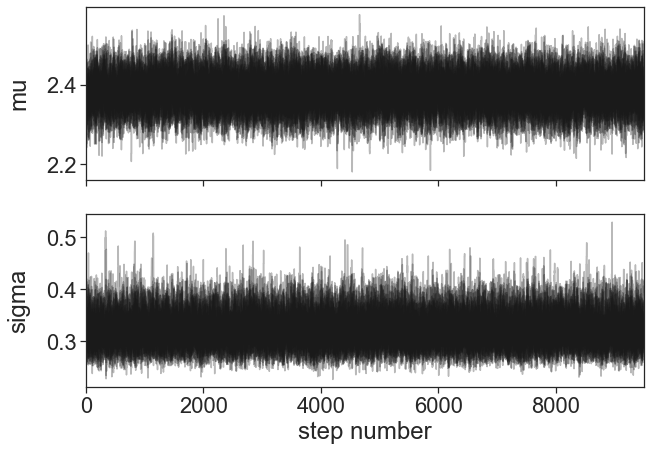

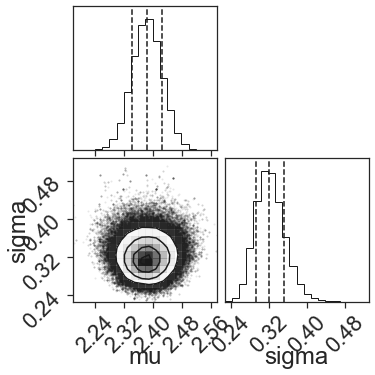

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 42/10500 [00:00<00:25, 413.09it/s]

[2.3805692349482186, 2.6271313640486107, 2.165834340776744, 2.196507266677011, 2.218533037776347, 2.491270599263661, 2.657017603248304, 2.445897111615607, 2.562335826277346, 2.619662556114694, 2.522351140197012, 1.5564333337262999, 2.5062953433084463, 2.3047507387572868, 2.264971584125212, 2.5034576061022746, 2.346615288874717, 2.244225952947431, 2.4174021819929363, 1.997970774983323, 2.414464574877539, 2.289100102585162, 1.7876689804483177, 2.65378640419413, 2.576616614161015, 2.4500349097588896, 2.4392167058206256, 2.640114821122015, 2.4700919991091466, 2.600561299521423, 2.7660424573470923, 2.607274535592948, 2.628169164910205, 2.5728237571515153, 2.292560161732647, 2.2441973493056495, 2.553817927478608, 2.6489922567707547, 2.5584412574001103, 1.3585341891875615, 2.7802485545048192, 2.803869129678334, 2.373083420399846, 2.893187881131772, 1.6075656349805563, 2.558833896504719, 2.583744181285841, 2.507273807222751, 2.4885059999632437, 2.751119632538993, 2.1259313483451114, 2.40808483

100%|██████████| 10500/10500 [00:19<00:00, 534.83it/s]


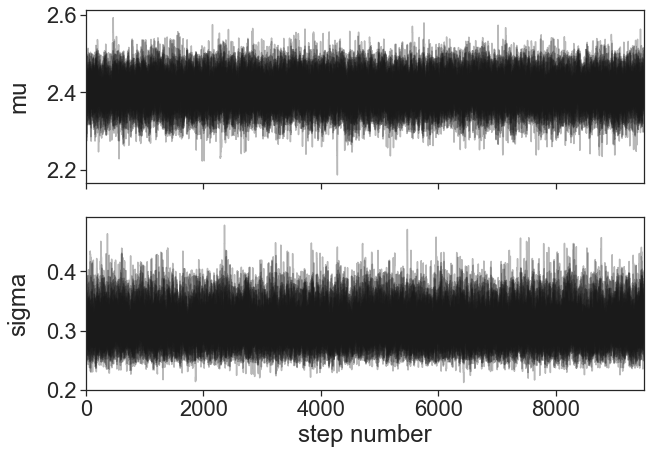

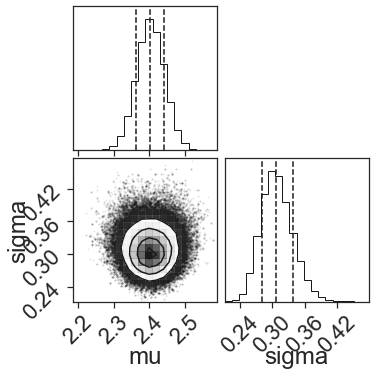

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 51/10500 [00:00<00:20, 507.81it/s]

[2.2619635841251693, 2.4817160334020385, 2.198637998011664, 2.297802414735138, 2.369074247894103, 2.476674043977931, 2.545352773376771, 2.561124079645918, 2.5157449118816504, 2.438570082941305, 2.451548969695049, 1.8507462168426316, 2.4965690910029417, 2.0461762924690987, 2.283685446709226, 2.4435232593233494, 2.416276789659189, 2.365151235691481, 2.3213289976843594, 1.9743312177557357, 2.256166569885672, 2.286456489606104, 1.9931730567824741, 2.76457823169287, 2.5372932915514834, 2.5230886616022694, 2.3352449459452655, 2.6076779524833666, 2.4569366853939743, 2.5570260437844587, 2.697688985762403, 2.6088976143509757, 2.6972544642673433, 2.5808927140513225, 2.2752997514587405, 2.2797671111202313, 2.5710157482319733, 2.488510579921569, 2.5678732020307162, 1.8495998428033198, 2.7920465633910077, 2.7572410828979548, 2.4006999783096745, 2.892967794883864, 1.563566542941553, 2.491763131921397, 2.438707478735976, 2.6156265827725824, 2.594672725094268, 2.679692622631241, 2.125940693062988, 2.3

100%|██████████| 10500/10500 [00:18<00:00, 579.52it/s]


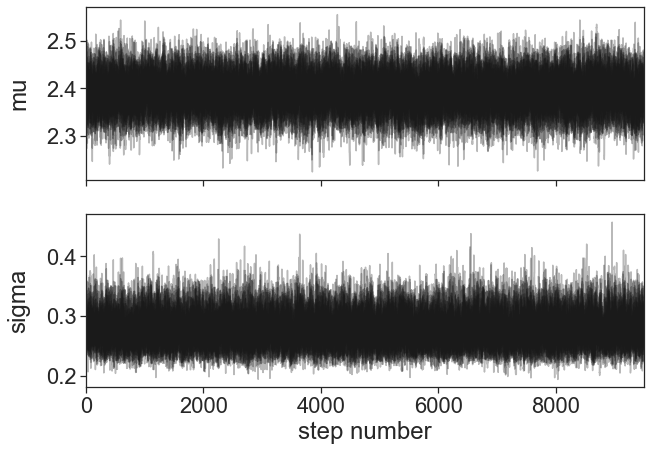

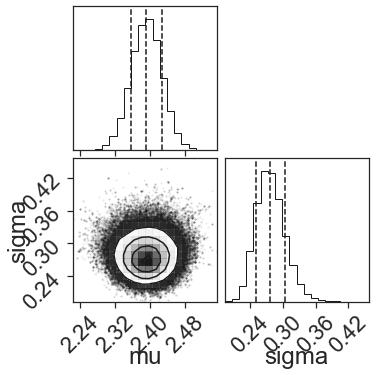

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 16/10500 [00:00<01:25, 122.64it/s]

[2.1762608599754367, 2.4979120851626453, 1.9064432996755862, 2.2672155380666794, 2.5918326525340785, 2.490824902075234, 2.6021426487961623, 2.505525577121367, 2.4640352202562386, 2.5347561004639485, 2.488476846179793, 1.9739241627881678, 2.4861083381995046, 2.3173820761025596, 2.2181667926076765, 2.547901245807246, 2.270884440324535, 2.2236488415867437, 2.2246526604372474, 1.764144945799968, 2.290876977281787, 2.2720741888423728, 1.9370670964887873, 2.6434597395813126, 2.5604428314309846, 2.5809226702489836, 2.487193711749017, 2.6005232563087577, 2.470663888086159, 2.6899610115854036, 2.755998872492737, 2.5892765967527542, 2.616352519410366, 2.5608471060660483, 2.364136228486552, 2.255750481024445, 2.715196690021578, 2.5109615478313727, 2.550809691423323, 1.7941615830934916, 2.7406320820916785, 2.7459545473174867, 2.3166243335170615, 2.8939173249636116, 1.5791348844369846, 2.4965082373512435, 2.457249232640826, 2.577732905761765, 2.5916912067715954, 2.7026828401227716, 2.07305542812048

100%|██████████| 10500/10500 [00:17<00:00, 615.20it/s]


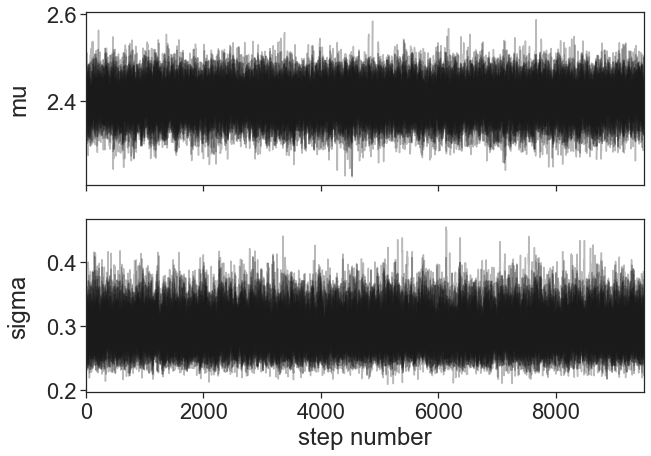

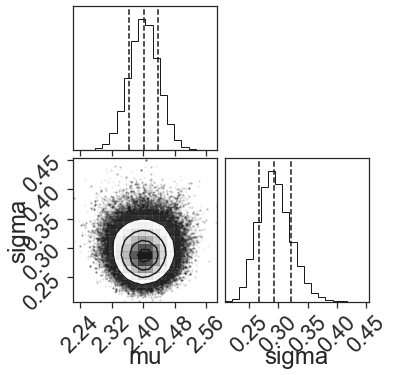

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 34/10500 [00:00<00:32, 324.12it/s]

[2.4696900603663265, 2.3481742661501976, 1.9712681988623986, 2.2728758658816295, 2.331650734503964, 2.505496298465873, 2.4931444169748294, 2.6097495280916374, 2.51516150891862, 2.22707807873964, 2.494581676854934, 2.041184572987463, 2.4827626498357382, 2.3040024500527694, 2.2246135271164933, 2.47598009760216, 2.3219145047081335, 2.215273725152871, 2.3753659240141713, 1.6456055370008047, 2.340082372325422, 2.2890857615529887, 1.335054554002676, 2.6667103089729696, 2.7043844917212514, 2.5584267485847705, 2.4729801607201525, 2.680162897496003, 2.4695348307098954, 2.6248337381233, 2.7407824199911883, 2.5681985990418292, 2.698163020164373, 2.677943827637661, 2.375260716766714, 2.305126460406575, 2.4836706759590674, 2.495708500213541, 2.5532062597161116, 1.7784187887561156, 2.790120654127648, 2.6633640959528986, 2.3498652945280463, 2.8952940117509236, 1.5937663149795624, 2.523722719835036, 1.802195440973945, 2.5973058875759647, 2.4738729252751117, 2.6282620221393698, 2.1272778443636042, 2.38

100%|██████████| 10500/10500 [00:17<00:00, 603.75it/s]


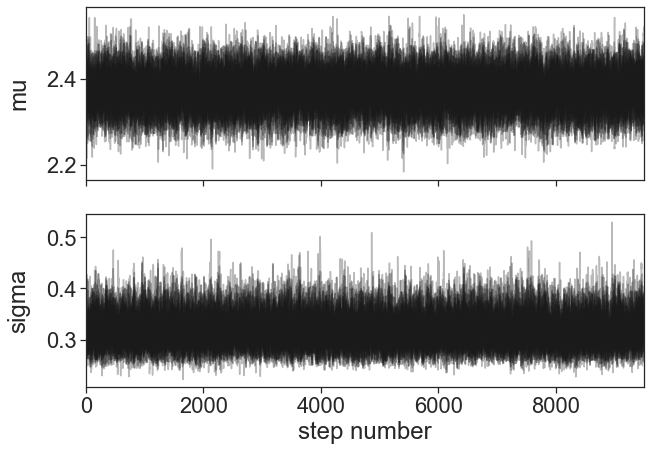

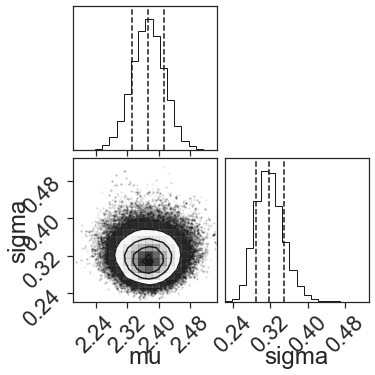

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 20/10500 [00:00<00:55, 188.93it/s]

[2.622446347062244, 2.513007653223204, 1.9153617236706337, 2.182506309648885, 2.3393086128812017, 2.49185439852308, 2.6490308263200752, 2.496557406153698, 2.6203481486441027, 2.3260031251038695, 2.505507702995405, 2.044567674847808, 2.4976815106475123, 2.3429324887748333, 2.3194064846082645, 2.520791892558827, 2.309310055739959, 2.1517951624288423, 2.292593536514769, 1.8061597620590113, 2.317074485896384, 2.301222525110315, 2.0877592911845175, 2.7276637207572563, 2.4869489949723267, 2.564158181415736, 2.3812708687346578, 2.6446623549651402, 2.478998167158635, 2.6142692949453004, 2.8894266677738893, 2.6194011464037072, 2.6355074414088673, 2.6779779489924485, 2.3759376578756823, 2.29029970754209, 2.8015772408040815, 2.6199270295164, 2.547968571456491, 1.6640290038477223, 2.707315233733898, 2.7372969651757812, 2.3775603761961683, 2.8939173249636116, 1.6824499054638233, 2.4380585004119095, 2.5054948568632143, 2.4855154589337576, 2.464039963849487, 2.670540725736719, 2.021524623922635, 2.44

100%|██████████| 10500/10500 [00:18<00:00, 553.46it/s]


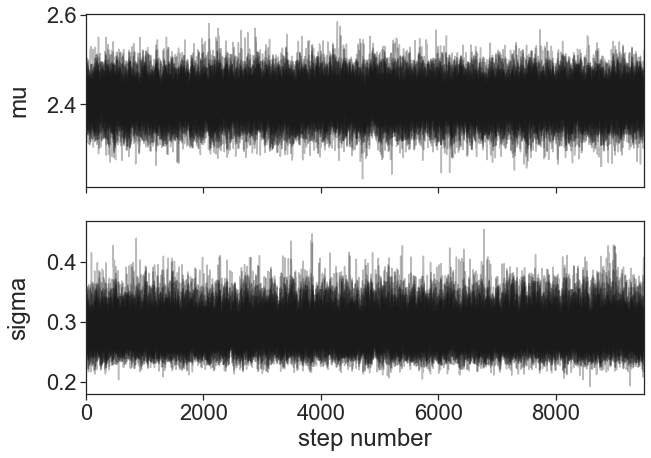

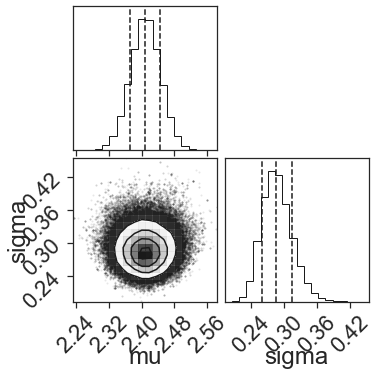

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/10500 [00:00<?, ?it/s]

[2.507029290203306, 2.3732886821698216, 1.9908465770532138, 2.1274809792208003, 2.392687926722589, 2.50709049648716, 2.5085529010606065, 2.6368706786845073, 2.6330389805586787, 2.3835811644919827, 2.5129619429149406, 2.0899359335638157, 2.5051929052439874, 2.4029503156062635, 2.276272791208368, 2.4944894004048264, 2.283026331303732, 2.1552015916942477, 2.3704614956785566, 1.9979325595741118, 2.3079769661119713, 2.402052753457876, 1.741511638525781, 2.6629625389522653, 2.59549546054542, 2.54735341613221, 2.37023528818861, 2.609313625456987, 2.478447111931778, 2.5673311290180187, 2.7966209456263083, 2.5474828057684493, 2.6443652165128975, 2.565543644729877, 2.2891685131258277, 2.3176495792030956, 2.5705409312187975, 2.548596599777806, 2.5678732020307162, 1.7617559015924247, 2.757141339602363, 2.7333259593717965, 2.407684106468463, 2.8931608480277715, 1.6007451260379908, 2.562556107706862, 1.7580815417268707, 2.5504491822851136, 2.4533534805735435, 2.6568564272541297, 2.0215364637242166, 

100%|██████████| 10500/10500 [00:20<00:00, 519.41it/s]


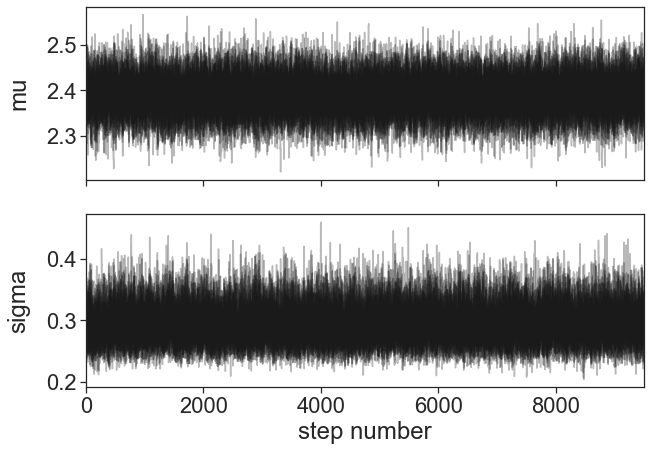

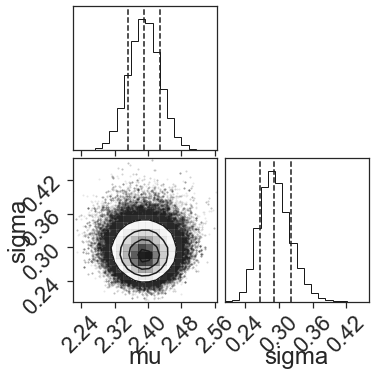

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 23/10500 [00:00<00:56, 186.34it/s]

[2.161865812542525, 2.338073949566181, 1.9197995885494585, 2.2744703190190996, 2.222743237914872, 2.471104738899787, 2.673598875868464, 2.625192505297707, 2.357314053770101, 2.4158578785909928, 2.4416553759742734, 1.8281536463771602, 2.461407150634507, 2.272929441345299, 2.3058479613147242, 2.454815070252942, 2.3859236131868378, 2.417258753288258, 2.372600317463476, 1.941418740499039, 2.3461655021417274, 2.3796951219525257, 1.8872384513338276, 2.6257106489410704, 2.5570819449285476, 2.5018611070985304, 2.336833592402172, 2.5949898688181965, 2.465014416436943, 2.63665563820934, 2.5191765131333397, 2.493002217514898, 2.6578023518952167, 2.657725092293826, 2.305029589872736, 2.2431598383205316, 2.852346528168696, 2.405837282264632, 2.563922000889997, 1.757416002649162, 2.805747926357585, 2.680252340084383, 2.394326732490274, 2.8933276905547256, 1.6269125708750538, 2.3565452727972396, 2.3683422889780306, 2.650036806529114, 2.4563645209556637, 2.6739495507563715, 2.0791978301119274, 2.44244

100%|██████████| 10500/10500 [00:18<00:00, 563.07it/s]


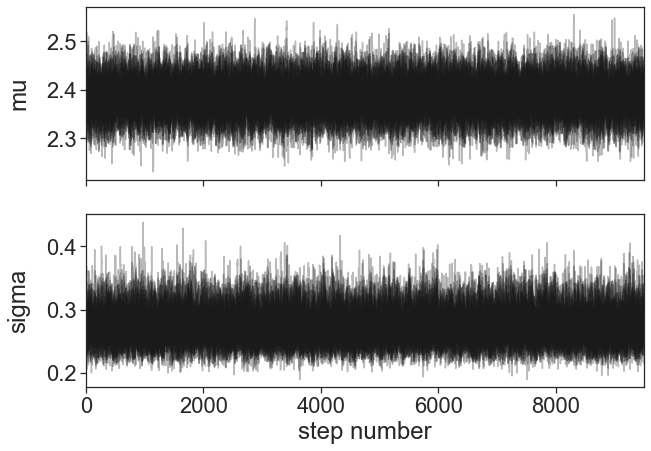

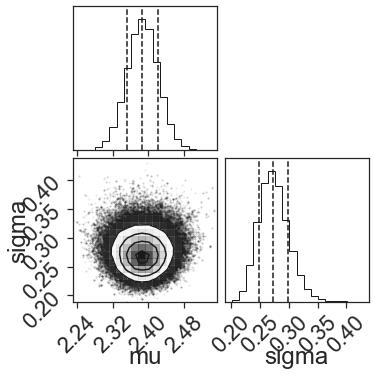

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 9/10500 [00:00<01:57, 89.09it/s]

[2.2001442133853617, 2.61165665211313, 1.9730673919065698, 2.2339540654771803, 2.445614597565418, 2.4875898348078875, 2.472288814721223, 2.4744255965882487, 2.5626091954539225, 2.414112436975946, 2.518716007321471, 1.7378762536862722, 2.5146915670608214, 2.2765487543617637, 2.2997683675018616, 2.493422506726751, 2.3699472934255854, 2.404110668360245, 2.3353886792443115, 1.9101441279308895, 2.276659177775505, 2.3400495516187387, 2.042810038814711, 2.7640763789339795, 2.5961031522808646, 2.5379817556491706, 2.385563323264699, 2.6530372265102398, 2.4839074174199482, 2.633277036379386, 2.619492110592995, 2.558651204407672, 2.585521465297032, 2.7271912032983128, 2.3218298340791814, 2.2719231503945068, 2.750502884571608, 2.6039655106201463, 2.544220308049959, 1.6701822809313118, 2.7224359029943463, 2.766593931093397, 2.3842002117783814, 2.8943616386811737, 1.6561832228146094, 2.4933998395345904, 2.5065297049099957, 2.6347777731958466, 2.466366717400617, 2.5893638542032607, 2.0940115306325224

100%|██████████| 10500/10500 [00:18<00:00, 577.08it/s]


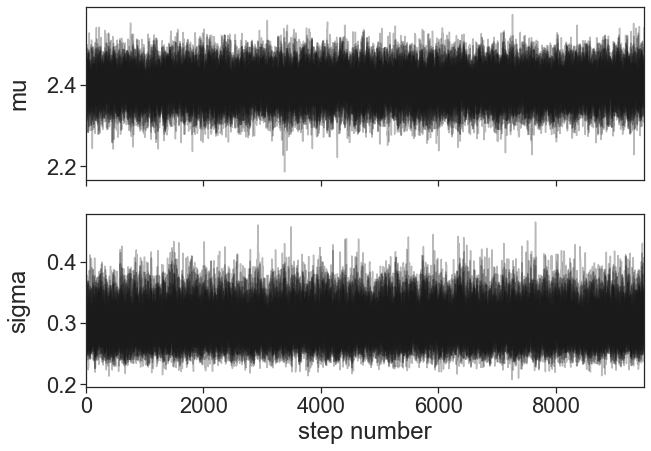

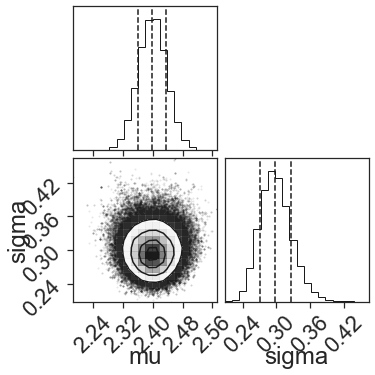

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 7/10500 [00:00<02:30, 69.50it/s]

[2.378395278163162, 2.482297963585078, 1.9384905531477898, 2.1380459168904347, 2.4329830728258064, 2.4721587648674928, 2.553702888302418, 2.511853132772814, 2.3772246939922357, 2.4446770309908836, 2.437866692645548, 1.674955717049458, 2.518332221212179, 2.1405296791626993, 2.263068948087742, 2.4928550755930514, 2.2027108548684766, 2.2009233208945775, 2.348140982378864, 1.754927547372531, 2.336964202285334, 2.3712114112936065, 1.8780672721794185, 2.623812580128403, 2.5346290609702486, 2.4986473180068907, 2.413297290440081, 2.642777811353459, 2.4546245818918573, 2.5620013582532333, 2.8469451570472035, 2.6153936644660654, 2.6681732880415066, 2.6262938297171483, 2.3577445028593993, 2.2536651881948044, 2.8503650333524266, 2.518623187127238, 2.547968571456491, 1.8464362818186295, 2.800713993403537, 2.698759275080034, 2.3827392405802263, 2.8930104686985585, 1.5937364912384477, 2.509065049866359, 2.588453484596833, 2.5585562260090895, 2.475580485156785, 2.8922972429490454, 2.099782963303614, 2

100%|██████████| 10500/10500 [00:20<00:00, 509.10it/s]


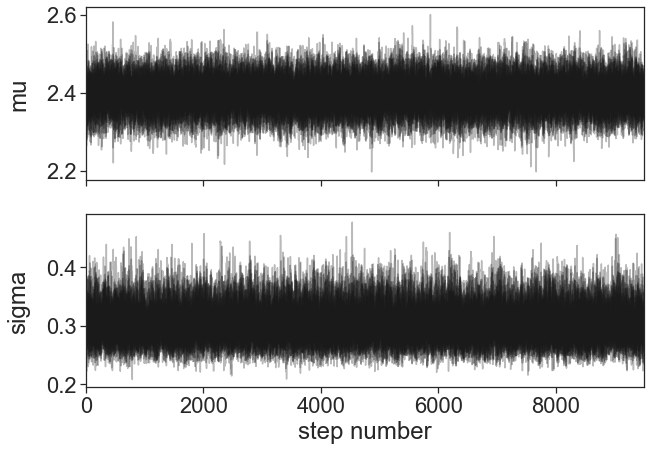

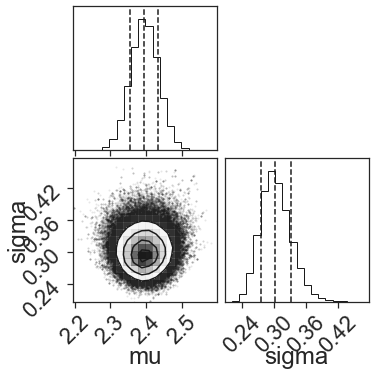

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 30/10500 [00:00<00:54, 191.87it/s]

[2.107882446637149, 2.3761748121185766, 2.1000947262678507, 2.223984806471744, 2.4953053821604936, 2.4682884459148857, 2.5929811500700555, 2.5640881041462227, 2.485477158213571, 2.3099941146331986, 2.405576582258281, 1.9270881586155673, 2.5219296254597796, 2.3295367862837715, 2.3083973351457097, 2.4623871510405504, 2.3704754553560887, 2.341419354821806, 2.2822344007797963, 1.6383742103004937, 2.346960866405099, 2.272065510918945, 2.013929630189872, 2.5666495020434428, 2.5426015270688582, 2.479501139668118, 2.4238751138388723, 2.612635464570854, 2.468978536862997, 2.6098185036230923, 2.8458318171729062, 2.5211149330050397, 2.7172033275737024, 2.6962488563618043, 2.2609104447561017, 2.271938421498696, 2.381708883171305, 2.5891429116347684, 2.5608082221572164, 1.6084711690922435, 2.8258415849157155, 2.6820650779307846, 2.3768420262023824, 2.892967794883864, 1.7363814872781813, 2.6179405843734855, 2.4515959951773567, 2.555865217437314, 2.410260787653154, 2.4110911931111785, 2.2160456134305

100%|██████████| 10500/10500 [00:18<00:00, 567.72it/s]


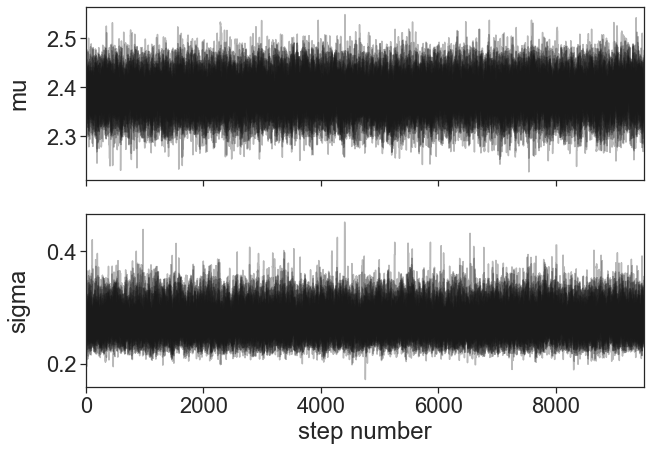

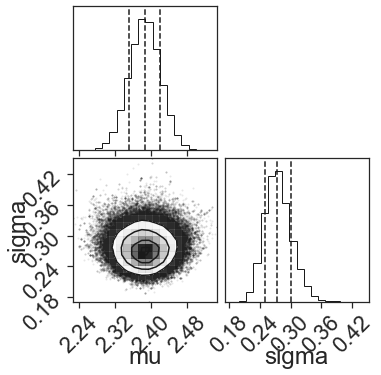

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 17/10500 [00:00<01:35, 110.21it/s]

[2.482952085614943, 2.5964255829339806, 1.9175080103648345, 2.288641471641998, 2.3307832534935056, 2.4648817354611685, 2.6097774322781153, 2.5890030264127724, 2.4775588995561844, 2.2083336378619483, 2.5738321563775983, 2.0462305514659693, 2.4987838416660972, 2.2673267843056015, 2.3559824462693846, 2.4536563826881244, 2.279567244884493, 2.2939157699960804, 2.562549270985268, 1.8359482079962153, 2.2925946850958208, 2.3146067982966936, 1.956947435351575, 2.6748681988070113, 2.6621638243287897, 2.5346844649882687, 2.4787289459953965, 2.6971083182320186, 2.4528853381013422, 2.5491763866359793, 2.879847610857583, 2.612967299014104, 2.6020953642918045, 2.61535406959774, 2.3453891845878294, 2.271932491501451, 2.4922678026269502, 2.614307610421186, 2.547968571456491, 1.6878391208641963, 2.7732130011873766, 2.6738406186732973, 2.3577728350161102, 2.893541073007406, 1.6561846067788923, 2.433780832165552, 2.5527126353852, 2.576915447238552, 2.6315963239325817, 2.364296678616378, 2.2507310909366973

100%|██████████| 10500/10500 [00:20<00:00, 506.02it/s]


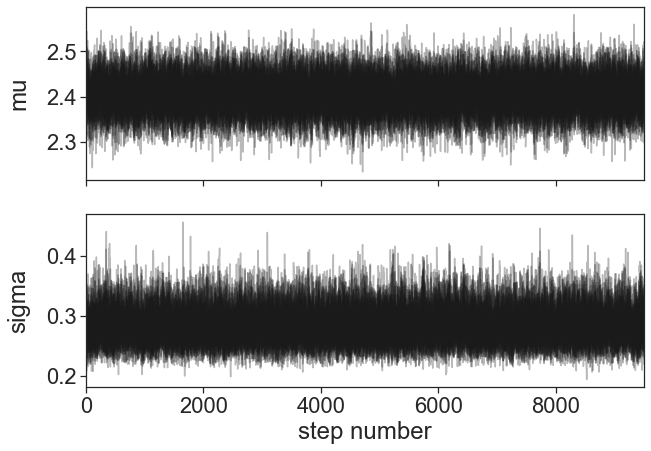

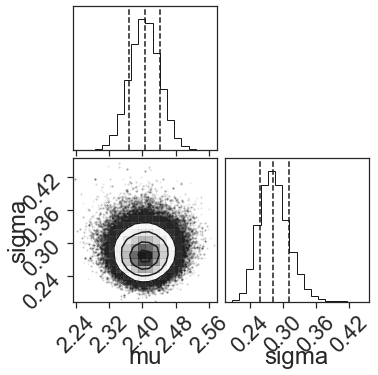

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 18/10500 [00:00<01:07, 156.18it/s]

[2.2347364023865466, 2.4497055861853028, 1.982046747531292, 2.313347270706619, 2.426942706885848, 2.497181963628705, 2.5273688838197206, 2.4542926072915936, 2.4369288807607696, 2.2558470590480746, 2.393690340314882, 1.8600787963273748, 2.517819270317126, 2.1930706071691417, 2.211597188481628, 2.390822715127568, 2.1345863490643295, 2.3696030014281737, 2.4416334529399295, 1.708760462204993, 2.270183915690774, 2.279369339557, 1.9104282464517977, 2.624276979544203, 2.4815178256578108, 2.6323770943371643, 2.288675836862001, 2.6022588718257187, 2.485544302995905, 2.6267428271462663, 2.812601783885928, 2.561415816716766, 2.6463408141930564, 2.6804367613551916, 2.2735126815390143, 2.253661783851229, 2.5990799283301964, 2.645445777819691, 2.5599990079568316, 1.464298968183363, 2.8321159215331773, 2.778243161661621, 2.3677531447949187, 2.893328828077051, 1.7016833986223319, 2.315708048631737, 2.5897735425714092, 2.618795839998712, 2.536940567735724, 2.710780031991568, 2.207637498141133, 2.443664

100%|██████████| 10500/10500 [00:19<00:00, 551.97it/s]


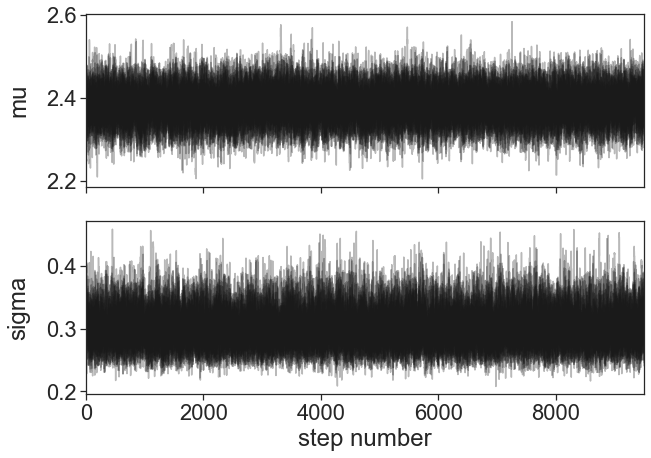

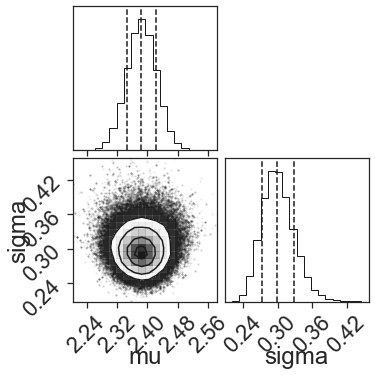

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/10500 [00:00<?, ?it/s]

[2.518645307894349, 2.5063026585276393, 2.221654793413278, 2.2312757709375513, 2.48614647705259, 2.45037538460763, 2.548288063381433, 2.5448708392978676, 2.399060307137802, 2.231853131478744, 2.491841497350683, 1.941256325198003, 2.473092454154473, 2.333449428214275, 2.2772457755426925, 2.4836871831918246, 2.3037417955194694, 2.207628510383362, 2.3299401179221477, 1.7403722044583705, 2.258029123633189, 2.385897117462145, 1.787712756879329, 2.6639918916872394, 2.572638279502254, 2.518110554823427, 2.4218981425214032, 2.6541369179717216, 2.480099577874525, 2.6351299601581424, 2.7998498364597886, 2.6253341650648307, 2.663344241329752, 2.7046043249353664, 2.2469218989652515, 2.2845882440062226, 2.48525642592703, 2.666376010261182, 2.5603880350094435, 1.7148264348512878, 2.652742910459915, 2.776796350819245, 2.3943062226670095, 2.8939173249636116, 1.5937389640216553, 2.5132123614991606, 2.513733718381869, 2.5442545397488634, 2.5916912067715954, 2.7204172617282167, 2.0896314486678023, 2.3832

100%|██████████| 10500/10500 [00:16<00:00, 636.92it/s]


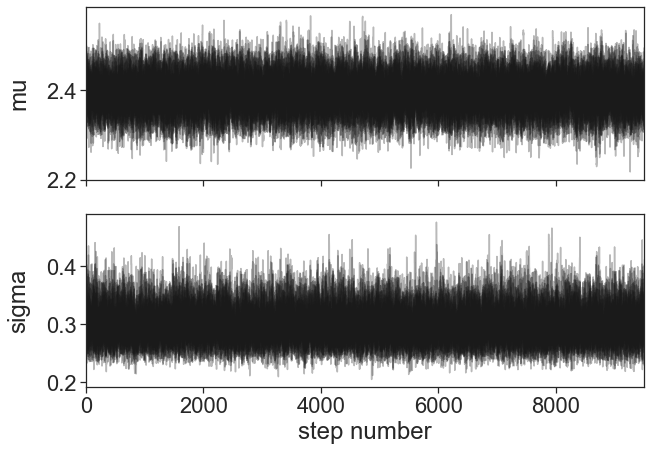

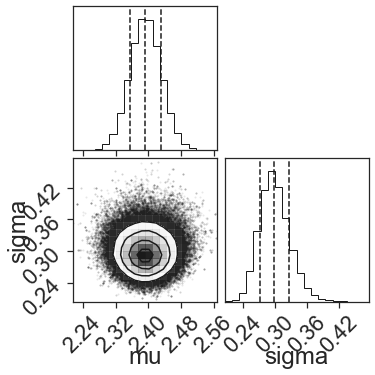

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 19/10500 [00:00<01:11, 146.10it/s]

[2.132565495970762, 2.5621242661442674, 2.232223803263292, 2.2736739528803604, 2.4876843200043512, 2.5076019968602203, 2.589550689276526, 2.4224981287863487, 2.46839468189215, 2.1572937720965073, 2.5400370149468023, 1.525985347305751, 2.465547214218378, 2.2701816563324972, 2.2706824599163946, 2.47595460071457, 2.362178823539557, 2.212406924045161, 2.3346272938188446, 1.764132717076536, 2.3243214660676332, 2.3712028285203393, 1.9755880086747197, 2.69056195239299, 2.607967257095341, 2.5166336699709015, 2.4671580276121765, 2.6339374535665123, 2.4812061529391145, 2.636287506741943, 2.8139144526253723, 2.511947717965251, 2.6341658269510777, 2.609556362428438, 2.283142000749576, 2.2323335413671703, 2.123623410049132, 2.5851463282585208, 2.544220308049959, 1.7617124654817604, 2.7441221971506815, 2.6708504810232263, 2.4055696979194727, 2.893418083053405, 1.538223064640278, 2.477623505094214, 2.6005923552491157, 2.550760634474001, 2.5289745473643097, 2.625948211166176, 2.135095673313524, 2.3804

100%|██████████| 10500/10500 [00:16<00:00, 635.36it/s]


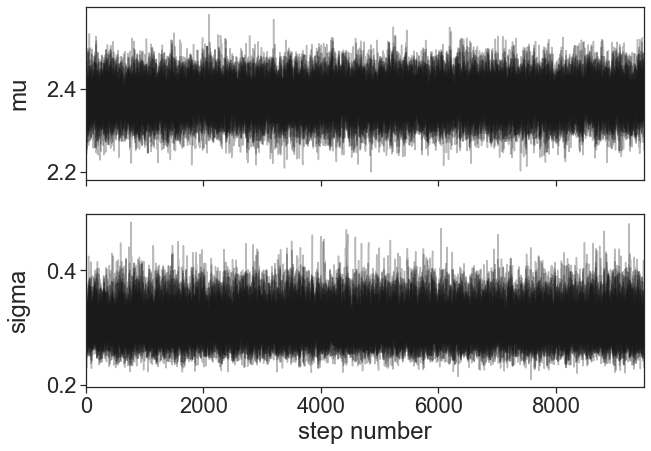

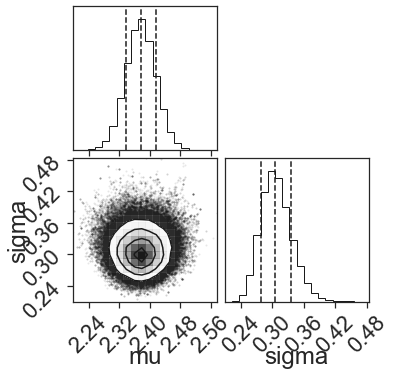

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 56/10500 [00:00<00:18, 555.31it/s]

[2.550998054465689, 2.4244785986188457, 2.040267654470379, 2.280042312040111, 2.5066924308831817, 2.492414192901052, 2.530435252152183, 2.67891766296818, 2.3901220542836046, 1.9216395971980693, 2.376410626289025, 1.8688370426872383, 2.4702061588574127, 2.3682781721463453, 2.277247152194068, 2.5432017466157943, 2.3826818718493397, 2.162873496293084, 2.3189828710602933, 1.719732493145339, 2.329917031976523, 2.288237007205492, 1.513416200476098, 2.7063319577090525, 2.5308194326216364, 2.5651226613327496, 2.4653878922225103, 2.6059641325325646, 2.4811987566584883, 2.6809174337267763, 2.884092017793075, 2.6327340256169194, 2.6615700467873578, 2.5490862964957732, 2.345389100374171, 2.251590789165845, 2.522714999953396, 2.5472721603768114, 2.5608082221572164, 1.7743543992235693, 2.786077285801247, 2.7197097216185617, 2.3352636696592874, 2.8930854361895184, 1.4996459018260542, 2.5775575082512896, 2.448386710571149, 2.5680319090458688, 2.498851855676425, 2.6507911276100793, 2.023314751747846, 2

100%|██████████| 10500/10500 [00:16<00:00, 652.96it/s]


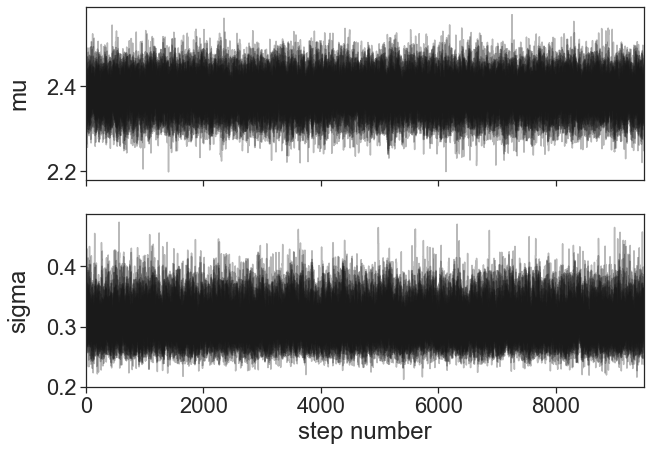

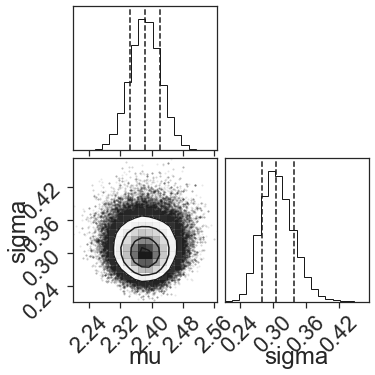

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 7/10500 [00:00<02:33, 68.50it/s]

[2.2675471190683893, 2.478986539269186, 1.928225330209452, 2.210076122254676, 2.4993325232646044, 2.4722222174721065, 2.567316683524357, 2.5783751253733653, 2.6667247578220707, 2.4726698265380906, 2.476506388105694, 1.5465312305882428, 2.498785543722295, 2.274787169957133, 2.281858579129157, 2.4836863057337, 2.2463806248555174, 2.335940333151209, 2.418019862030765, 1.652813705051075, 2.321925581029163, 2.20513517898601, 1.966403956780692, 2.6426701541200606, 2.6446254596271834, 2.510514380200089, 2.407202391092818, 2.6031310391948925, 2.46953300782903, 2.659187782294713, 2.7514644320210233, 2.5549333374851733, 2.7116911999555753, 2.694906952843162, 2.2942512930797623, 2.263925878365178, 2.4618196201094413, 2.4919890516160352, 2.5603880350094435, 1.7784187887561156, 2.7295864732127213, 2.7360686028099748, 2.377570584919085, 2.8952940117509236, 1.555421851913561, 2.8106627479746296, 2.5446600626288234, 2.6215717263915543, 2.553281244744404, 2.587989158049856, 2.0997858063982187, 2.371271

100%|██████████| 10500/10500 [00:16<00:00, 651.11it/s]


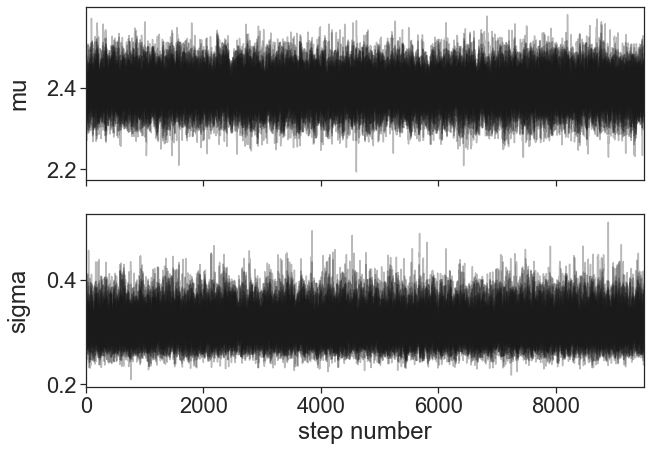

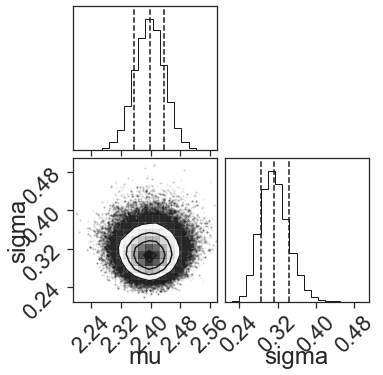

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 18/10500 [00:00<01:12, 144.48it/s]

[2.3336217008627704, 2.579420361830854, 1.9485114306388949, 2.2184759269477468, 2.436619202970107, 2.4777616761293655, 2.551729331056351, 2.561535568692372, 2.464035235158873, 2.388120456945678, 2.5733467082192734, 1.7233896199475516, 2.5178087403475784, 2.2664328589708505, 2.327644902916292, 2.5142485585985077, 2.4405685106928336, 2.227305427006654, 2.1543426286306357, 1.8562568527667467, 2.3438938288285667, 2.241558286463683, 2.0391659413275436, 2.665368476630715, 2.650994845873753, 2.541709691681649, 2.41528082302143, 2.6431999641262007, 2.4581109130898358, 2.7131926937254245, 2.683663313349395, 2.5650593556786934, 2.662922350259194, 2.6430894036746273, 2.3813808647026016, 2.271925608695254, 2.6216496658678623, 2.6378904377096717, 2.5487235785616895, 1.6577391466125342, 2.8188323252418943, 2.72064955981693, 2.3993061343032327, 2.8952940117509236, 1.5791420441427981, 2.4022549272860454, 2.471959275666375, 2.5092716953477088, 2.595975590162832, 2.7534891566059088, 2.0407383241856545, 

100%|██████████| 10500/10500 [00:16<00:00, 650.01it/s]


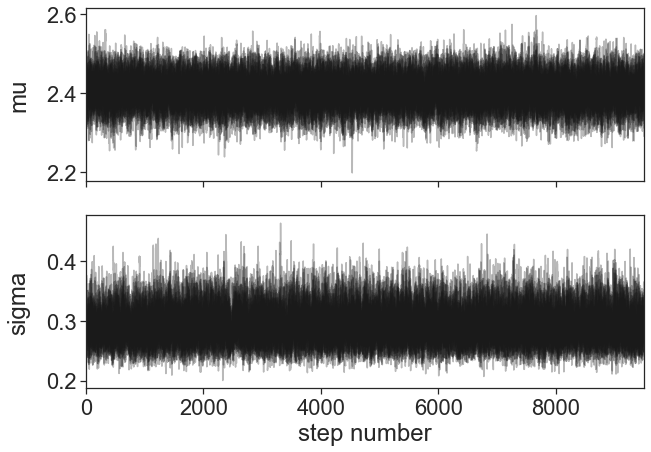

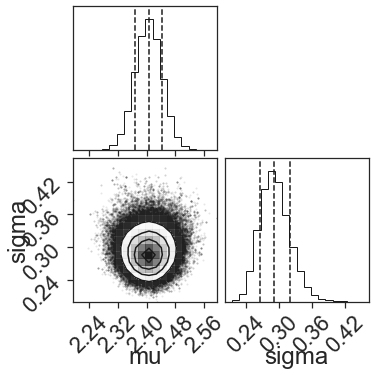

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 56/10500 [00:00<00:18, 557.80it/s]

[2.0458587167497173, 2.5180404609829674, 2.1000143574802563, 2.1571303961977377, 2.3308378254057214, 2.4892105749578337, 2.602493910828708, 2.6379433141341457, 2.444107377422564, 2.378448821961391, 2.518184877193708, 1.7602062275041475, 2.510007578446239, 2.2692328289240455, 2.3701449135704062, 2.5262734847364845, 2.1409693850258247, 2.388137995275076, 2.2005269284749702, 1.8462772832311851, 2.327538317533672, 2.2365454965395437, 1.7609504932048547, 2.6768554210237507, 2.5070217726483377, 2.5080257461696065, 2.4341757223266667, 2.657121841968741, 2.4839239915475337, 2.5345741528600185, 2.8677361481834005, 2.5740220677374683, 2.671377771712206, 2.657007014970177, 2.275281089289468, 2.2659254580550834, 2.76787953331792, 2.4150779020337816, 2.5599990079568316, 1.790321889907836, 2.7379018465831173, 2.744680286439831, 2.367772891635451, 2.8929572508517536, 1.5554371464677006, 2.447015733926756, 2.475032665048966, 2.670813028985863, 2.4744502756103968, 2.7471655872295795, 2.178916201067678,

100%|██████████| 10500/10500 [00:15<00:00, 664.63it/s]


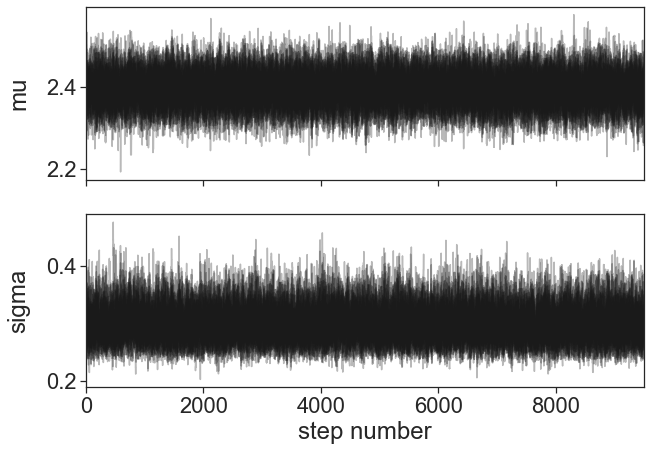

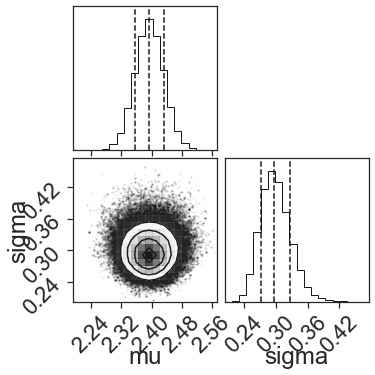

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 65/10500 [00:00<00:16, 647.61it/s]

[1.992588692164283, 2.385319515280106, 2.120594711118922, 2.3015644958108274, 2.5060784328297556, 2.4755367079715778, 2.585115510643552, 2.482755340090765, 2.384905005306905, 2.4757926398748937, 2.484541182303432, 1.9590613038099574, 2.4776625104856738, 2.308184043784728, 2.260159185177584, 2.4269010523515813, 2.274316090869613, 2.224562500049183, 2.2751598086841214, 1.8595610496103856, 2.3020693459313244, 2.2702399012548615, 2.05017929095715, 2.6694462253545823, 2.601532327827034, 2.468967542112947, 2.5063432876910174, 2.598385159602437, 2.4882345123328946, 2.6122790762525647, 2.5474549596765783, 2.583654400569083, 2.7216521858478946, 2.586190284127971, 2.342447721283787, 2.225682680639358, 2.6417952296918807, 2.6192221523493364, 2.5635751358170222, 1.3087690388810256, 2.6930162096693766, 2.724481385217873, 2.363197621185086, 2.8943695228980695, 1.639024459315113, 2.275702981004652, 2.449016454642951, 2.5498582576841797, 2.5537495160965706, 2.883533879718619, 2.1192315848437624, 2.430

100%|██████████| 10500/10500 [00:15<00:00, 658.04it/s]


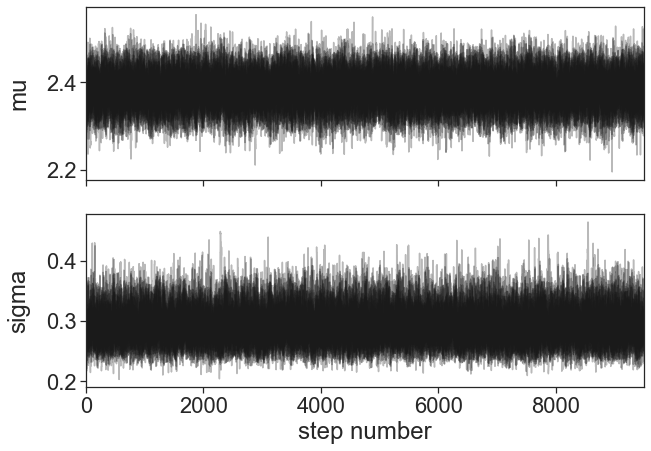

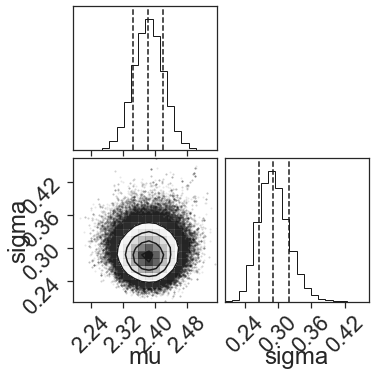

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 59/10500 [00:00<00:17, 589.11it/s]

[2.2693842998586087, 2.614860156456253, 1.86803599904595, 2.198501767465176, 2.3767059928910492, 2.46997057867095, 2.522772605705918, 2.5200163653522307, 2.459710454215594, 2.2707528935879107, 2.503866417677942, 1.8347697862117236, 2.5563146745154675, 2.265408076932553, 2.276301883664818, 2.4640983643819023, 2.3813863699249653, 2.2931769377395064, 2.1580339769351387, 1.967532474110321, 2.3079895914651463, 2.3668784178167095, 1.2353388014692803, 2.660136299800104, 2.6061652025494433, 2.538498770456723, 2.3295067717826305, 2.664889048844918, 2.4817413218693756, 2.640757009647991, 2.774447186665524, 2.5544809488870386, 2.6361777179439203, 2.610793495102822, 2.286595245242094, 2.2143327559029693, 2.593071620537367, 2.463680757358846, 2.558485643296108, 1.8090891966157945, 2.7257774357389, 2.768623243597209, 2.378311875690141, 2.892939147344975, 1.60075250176797, 2.563378628070931, 2.6255271419932957, 2.5327620732318143, 2.47559452443468, 2.5278521745462896, 2.1731709201559415, 2.4297042477

100%|██████████| 10500/10500 [00:16<00:00, 653.71it/s]


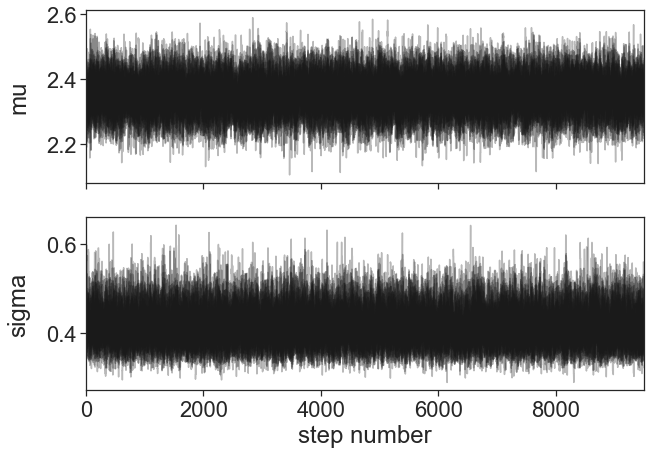

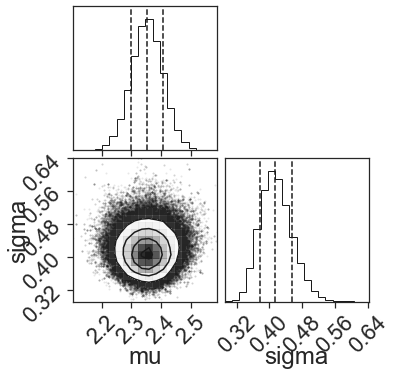

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 21/10500 [00:00<00:50, 208.54it/s]

[2.385376147286604, 2.565227839258409, 2.0387991955626465, 2.263890846512334, 2.205789299114096, 2.492396328900493, 2.649000397390163, 2.5358799208687532, 2.467669553857393, 2.4874691504178195, 2.5213243447186033, 1.9655858154444683, 2.472528707031245, 2.2883070180315155, 2.2591846535297884, 2.5147557412761947, 2.2846735763799453, 2.322694784142757, 2.4457262227361816, 1.7403620757908278, 2.3603414196422623, 2.2855478330752, 1.779102214017371, 2.7755137461078707, 2.6046315281804637, 2.442832550931084, 2.402432215071003, 2.5774449832129154, 2.470087507654425, 2.605856676486326, 2.6460037027491388, 2.607693758801273, 2.572378336502226, 2.6349123237169283, 2.346848034393704, 2.199062770464157, 2.6909066496567444, 2.670797636151327, 2.5678732020307162, 1.3350327779176026, 2.7383960688479965, 2.7480455589773527, 2.3498461118859613, 2.8931247434080265, 1.6269398542340265, 2.5126802214337536, 2.4267724228398397, 2.6697508550922886, 2.5997723312191408, 2.818695174643391, 2.1515507232898994, 2.

100%|██████████| 10500/10500 [00:15<00:00, 659.97it/s]


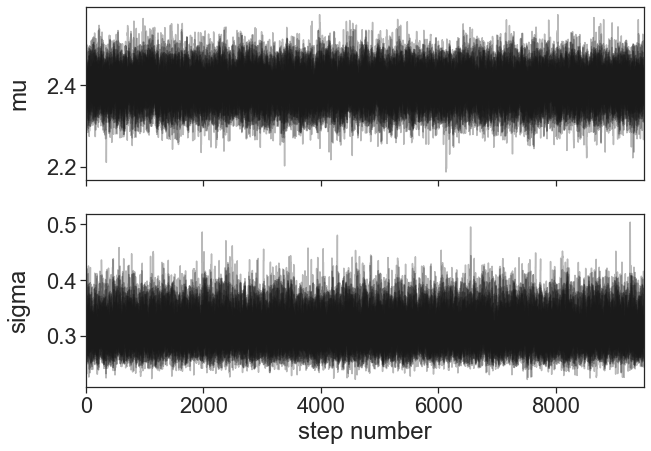

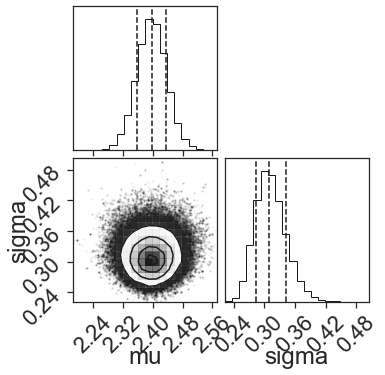

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 52/10500 [00:00<00:20, 514.40it/s]

[2.468174883418708, 2.521548139031595, 2.1074016187971125, 2.151608267000825, 2.4549853398589407, 2.4660089209028175, 2.5765516344327524, 2.4470348083177975, 2.4835358620033996, 2.232771294051173, 2.4459824553478424, 1.7601194589046052, 2.5423988573523064, 2.2856642360683956, 2.3333184770811295, 2.488581559329285, 2.3126129643947273, 2.4070665372098548, 2.255952717386395, 1.7403769668417008, 2.3690489032111386, 2.287348097757683, 0.5711456369113735, 2.6405917260779157, 2.437850890488339, 2.6097505115671136, 2.39967322705614, 2.6916632723857163, 2.4728962077435916, 2.598871074873104, 2.6157790106820666, 2.70434971296694, 2.6205280007447302, 2.667231519864517, 2.3371964017567417, 2.271932583946472, 2.6763126857156947, 2.605854939311857, 2.554408813349735, 1.816224953966352, 2.742727049825006, 2.7488648820377275, 2.3623977635138873, 2.893187881131772, 1.571492921868044, 2.5271717618915948, 2.553760347701988, 2.5128834309578045, 2.528964303266172, 2.660630646008161, 2.0683982890366965, 2.3

100%|██████████| 10500/10500 [00:16<00:00, 630.21it/s]


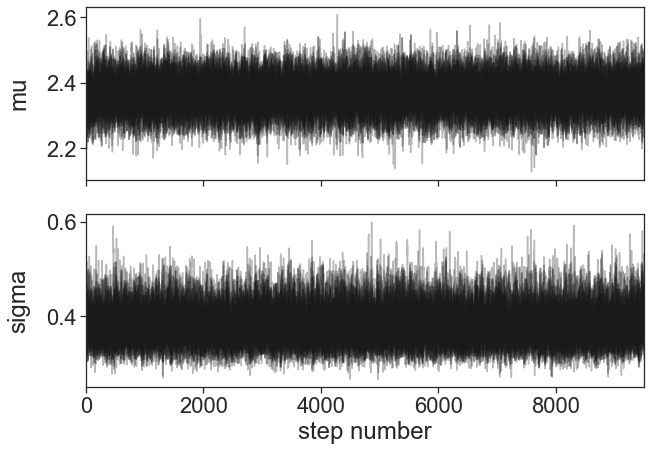

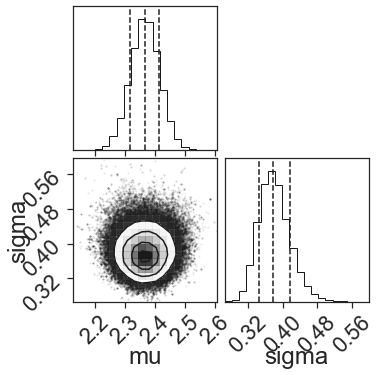

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 57/10500 [00:00<00:18, 564.78it/s]

[1.9312381182815497, 2.5862837194001806, 2.0462016317060083, 2.237506618503009, 2.3768242062720346, 2.468829146678797, 2.629080702693256, 2.567050031237469, 2.389310757090849, 2.358895092485444, 2.3880762332428858, 1.948106894238916, 2.5041385639459866, 2.1732308831280793, 2.264990372463662, 2.531169858465977, 2.2181572706246153, 2.2318069690641558, 2.351101257922678, 1.9786828277678723, 2.3439175971454675, 2.249385420443188, 1.8780758740842363, 2.766821546723614, 2.5359056348174964, 2.5225718274865434, 2.39337932028266, 2.6287985509470055, 2.480078668855666, 2.617016714194404, 2.709758369212254, 2.55120505860554, 2.652019238513178, 2.5892250212534536, 2.2581562732910747, 2.2846022473573333, 2.5909552413081762, 2.5781618885591904, 2.5544653328621765, 1.6084573416826655, 2.854161429333698, 2.7403522058568255, 2.392883145064633, 2.893187881131772, 1.5791448701660977, 2.697759976560979, 2.580965456921791, 2.4491740649522717, 2.5480834601208793, 2.6906528771908844, 2.1312230799730845, 2.41

100%|██████████| 10500/10500 [05:11<00:00, 33.75it/s] 


In [ ]:

import seaborn as sns
%load_ext autoreload
%autoreload
# Set the seaborn theme and font scale
sns.set_theme(style="ticks",font_scale=2)
plt.rcParams["figure.figsize"] = (9,6.)

steps=10500                                  
nwalkers=30
inValuesW=[2.3,0.3]
inValues=inValuesW

pos = inValues+ [0.01,0.01] * np.random.randn(nwalkers,len(inValues) )
nwalkers, ndim = np.shape(pos)

runs=100

FWHM_log10=[]

for iter in range(0,runs):
    temp=[]
    for gal in FWHM_posterior_int_log10:
        print(gal)
        temp.append(np.random.choice(gal))
    FWHM_log10.append(temp)




for iter in range(0,runs):
    FWHM=FWHM_log10[iter]
    print(FWHM)
    sampler = emcee.EnsembleSampler(
        nwalkers, ndim, log_probability, args=(FWHM,FWHM)
    )
    sampler.run_mcmc(pos, steps, progress=True)



    dis=1000
    labels = ["mu", "sigma"]
    fig, axes = plt.subplots(len(labels), figsize=(10, 7), sharex=True)
    samples = sampler.get_chain(discard=dis)
    logProb=sampler.get_log_prob(discard=dis)
    maskWalkers=[False if np.isinf(logProb[steps-dis-10,i]) else True for i in range(0,nwalkers)]
    samples=np.array([s[maskWalkers] for s in samples])
    for i in range(len(labels)):
        ax = axes[i]
        ax.plot(samples[:, :, i], "k", alpha=0.3)
        ax.set_xlim(0, len(samples))
        ax.set_ylabel(labels[i])
        ax.yaxis.set_label_coords(-0.1, 0.5)
    axes[-1].set_xlabel("step number")
    plt.show()


    ndim=len(labels)
    samples = sampler.get_chain(discard=dis)
    samples=np.array([s[maskWalkers] for s in samples])
    samples=samples.reshape(np.shape(samples)[0]*np.shape(samples)[1],np.shape(samples)[2])

    fig = corner.corner(
        samples, labels=labels,quantiles=[.16,.50,.84]
    )
    plt.show()

    results=[]
    r16,r84=[],[]
    for i in range(ndim):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        results.append(mcmc[1])
        r16.append(mcmc[0])
        r84.append(mcmc[2])
        q = np.diff(mcmc)
        txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
        txt = txt.format(mcmc[1], q[0], q[1], labels[i])
        display(Math(txt))

    np.save("Samples/samples"+str(iter)+".npy",samples)


In [ ]:
import seaborn as sns
%load_ext autoreload
%autoreload
# Set the seaborn theme and font scale
sns.set_theme(style="ticks",font_scale=2)
plt.rcParams["figure.figsize"] = (9,6.)
                                             #1 Blue, 2 Middle, 3 Red


FWHM_log10=np.log10(FWHM)

steps=10500                                  
nwalkers=30
inValuesW=[2.3,0.3]
inValues=inValuesW
pos = inValues+ [0.01,0.01] * np.random.randn(nwalkers,len(inValues) )
nwalkers, ndim = np.shape(pos)

sampler = emcee.EnsembleSampler(
    nwalkers, ndim, log_probability, args=(FWHM,FWHM_posterior_int_log10)
)
sampler.run_mcmc(pos, steps, progress=True)


#FWHM = np.array([np.random.choice(arr) for arr in dFWHM])


In [ ]:
import seaborn as sns
%load_ext autoreload
%autoreload
# Set the seaborn theme and font scale
sns.set_theme(style="ticks",font_scale=2)
plt.rcParams["figure.figsize"] = (9,6.)
                                             #1 Blue, 2 Middle, 3 Red


FWHM_log10=np.log10(FWHM)

steps=10500                                  
nwalkers=30
inValuesW=[2.3,0.3]
inValues=inValuesW
pos = inValues+ [0.01,0.01] * np.random.randn(nwalkers,len(inValues) )
nwalkers, ndim = np.shape(pos)

sampler = emcee.EnsembleSampler(
    nwalkers, ndim, log_probability, args=(FWHM,FWHM_posterior_int_log10)
)
sampler.run_mcmc(pos, steps, progress=True)



In [ ]:
dis=1000
labels = ["mu", "sigma"]
fig, axes = plt.subplots(len(labels), figsize=(10, 7), sharex=True)
samples = sampler.get_chain(discard=dis)
logProb=sampler.get_log_prob(discard=dis)
maskWalkers=[False if np.isinf(logProb[steps-dis-10,i]) else True for i in range(0,nwalkers)]
samples=np.array([s[maskWalkers] for s in samples])
for i in range(len(labels)):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
axes[-1].set_xlabel("step number")
plt.show()


ndim=len(labels)
samples = sampler.get_chain(discard=dis)
samples=np.array([s[maskWalkers] for s in samples])
samples=samples.reshape(np.shape(samples)[0]*np.shape(samples)[1],np.shape(samples)[2])

fig = corner.corner(
    samples, labels=labels,quantiles=[.16,.50,.84]
)
plt.show()

results=[]
r16,r84=[],[]
for i in range(ndim):
    mcmc = np.percentile(samples[:, i], [16, 50, 84])
    results.append(mcmc[1])
    r16.append(mcmc[0])
    r84.append(mcmc[2])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))

In [ ]:
fw=np.linspace(0.01,1000,10000)
dfw=np.ones(len(fw))*0

l=Likelihood(fw,dfw,results[0],results[1])
plt.plot(fw,l)
# Calculate the upper and lower bounds with 0.5 error
l_upper = Likelihood(fw, dfw, 5.636 + 0.07, 0.606+0.06)
l_lower = Likelihood(fw, dfw, 5.636 - 0.07, 0.606-0.06)
# Calculate the upper and lower bounds for the second parameter with 0.06 error


# Plot the upper and lower bounds
plt.plot(fw, l_upper, linestyle='--', color=Antique_3.mpl_colors[1])
plt.plot(fw, l_lower, linestyle='--', color=Antique_3.mpl_colors[1])

# Fill the area between the bounds
plt.fill_between(fw, l_lower, l_upper, color=Antique_3.mpl_colors[1], alpha=0.3)

plt.xlabel('FWHM')
plt.ylabel('Likelihood')
plt.title('Likelihood with Error Bounds')
plt.show()